In [333]:
# Creating a vector of libraries we need
# Install them if you haven't installed them yet
lib = c('readr', 'hash', 'tidyverse', 'data.table', 'zoo', 'dplyr', 'ggmap', 'skimr',
        'devtools', 'visdat', 'DataExplorer', 'inspectdf', 'ggplot2', 'ggcorrplot', 'corrplot', 'reshape2',
       'factoextra', 'e1071', 'forecast', 'mice', 'randomForest', 'reshape2', 'lubridate', 'ggmap', 'GGally', 'viridis', 'hrbrthemes')

In [584]:
for (item in lib){
    install.packages(item)
}


The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages are in
	/var/folders/yb/rxg8x13d235dsjs27my4zz6w0000gp/T//Rtmpc4ZIne/downloaded_packages

The downloaded binary packages 

## Note:
Please run the library cells twice in order to prevent potencial errors

In [2]:
library(tidyverse)
library(readr)
library(ggmap)
library(GGally)
library(dplyr)
library(glue)
library(visdat)
library(lubridate)
library(data.table)
library(reshape2)
library(zoo)
library(tidyverse)
library(ggplot2)
library(ggmap)
library(ggcorrplot)
library(corrplot)
library(reshape2)
library(factoextra)
library(e1071)
library(randomForest)
library(forecast)
library(mice)
library(skimr)
library(DataExplorer)
library(inspectdf)
library(devtools)
library(glue)
library(repr)
library(viridis)
library(hrbrthemes)

In [3]:
# Set the output size
options(repr.plot.width = 20, repr.plot.height = 15)

# Import and Merging the datasets


In [4]:
# Set the path of the main folder
main_folder <- "/Users/vahid/Desktop/Uni/R Project/Dataset - Assignment"

In [5]:
# Get a list of all the subfolders in the main folder
subfolders <- list.dirs(main_folder, recursive = FALSE)

In [6]:
# Initialize an empty list to store dataframes
df_list <- list()

In [7]:
# Loop through each subfolder
for (subfolder in subfolders) {
  
  # Get a list of all the csv files in the subfolder
  csv_files <- list.files(subfolder, pattern = "^principal_offence_category_.*\\.csv$", full.names = TRUE)
  
  # Loop through each csv file
  for (csv_file in csv_files) {
    
    # Read the csv file
    df <- read.csv(csv_file, stringsAsFactors = FALSE)
    
    # Extract the month from the filename
    month <- tolower(substr(csv_file, 89, 91)) # Assumes the path is "/path/to/main/folder/subfolder/Principal_Offence_Category_Month.csv"
    
    # Add the "month" and "folder" columns to the dataframe
    df$month <- month
    df$year <- substr(subfolder, 57, 61)
    
    # Append the dataframe to the list
    df_list[[length(df_list) + 1]] <- df
  }
}

In [8]:
# Concatenate all the dataframes into a single dataframe
all_data <- do.call(rbind, df_list)
head(all_data)

# Creating a new dataset with all data in our directory for backup
write.csv(all_data, "/Users/vahid/Desktop/Uni/R Project/Dataset - Assignment/all_data.csv", row.names=FALSE)


# # # Clearing all object except the all data to free the ram usage
# # rm(list=setdiff(ls(), "all_data"))


,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,...,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,month,year
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,...,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,apr,2014
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,...,16,19.5%,188,83.6%,37,16.4%,24,100.0%,apr,2014
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,...,6,35.3%,40,88.9%,5,11.1%,16,100.0%,apr,2014
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,...,2,25.0%,79,92.9%,6,7.1%,4,100.0%,apr,2014
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,...,6,10.7%,209,94.6%,12,5.4%,1,100.0%,apr,2014
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,...,5,15.2%,124,87.9%,17,12.1%,10,100.0%,apr,2014


# Initial Descriptive anlysis for conprehending data structure

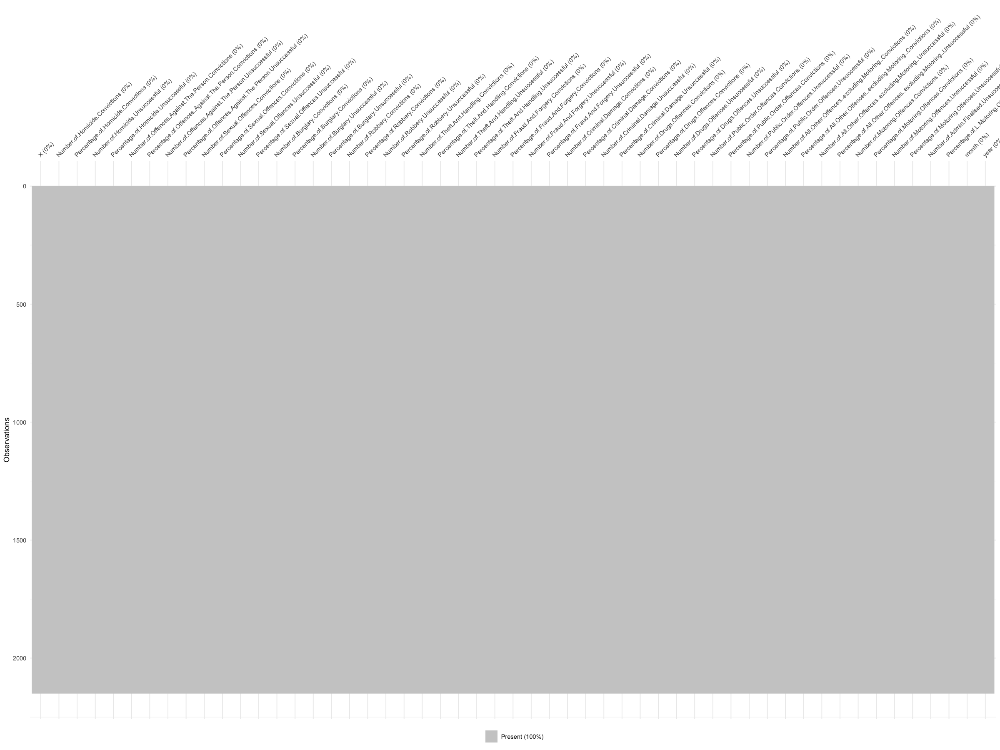

In [9]:
vis_miss(all_data)

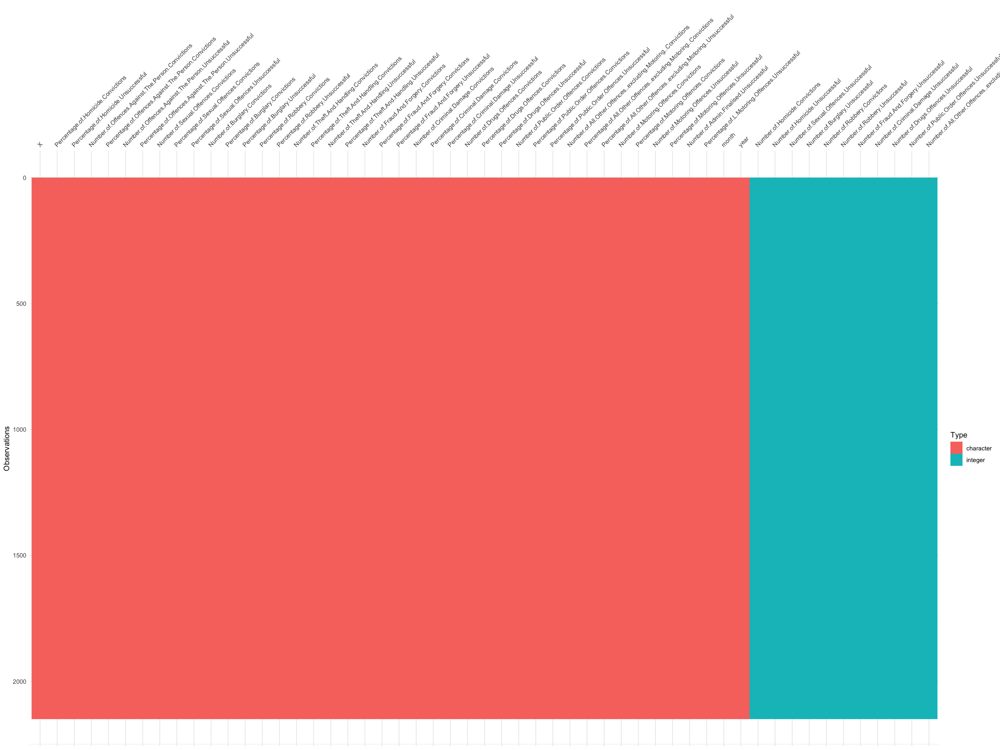

In [10]:
vis_dat(all_data)

# Data Cleansing


In [11]:
# all_data <- read.csv("/Users/vahid/Desktop/Uni/R Project/Dataset - Assignment/all_data.csv")


### Get a glimpse of our data

In [12]:
glimpse(all_data)

Rows: 2,150
Columns: 53
$ X                                                                  <chr> "Na~
$ Number.of.Homicide.Convictions                                     <int> 81,~
$ Percentage.of.Homicide.Convictions                                 <chr> "85~
$ Number.of.Homicide.Unsuccessful                                    <int> 14,~
$ Percentage.of.Homicide.Unsuccessful                                <chr> "14~
$ Number.of.Offences.Against.The.Person.Convictions                  <chr> "7,~
$ Percentage.of.Offences.Against.The.Person.Convictions              <chr> "74~
$ Number.of.Offences.Against.The.Person.Unsuccessful                 <chr> "2,~
$ Percentage.of.Offences.Against.The.Person.Unsuccessful             <chr> "25~
$ Number.of.Sexual.Offences.Convictions                              <chr> "69~
$ Percentage.of.Sexual.Offences.Convictions                          <chr> "72~
$ Number.of.Sexual.Offences.Unsuccessful                             <int> 269~
$ Percentage.of.

### Dropping the percentage columns as they are useless


In [13]:
drop_percentage_columns <- function(dataframe) {
  dataframe <- dataframe %>% select(-starts_with('Per'))
  return(dataframe)
}

all_data <- drop_percentage_columns(all_data)
head(all_data)

,X,Number.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,Number.of.Sexual.Offences.Unsuccessful,Number.of.Burglary.Convictions,Number.of.Burglary.Unsuccessful,Number.of.Robbery.Convictions,...,Number.of.Drugs.Offences.Unsuccessful,Number.of.Public.Order.Offences.Convictions,Number.of.Public.Order.Offences.Unsuccessful,Number.of.All.Other.Offences..excluding.Motoring..Convictions,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,month,year
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,279,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,2,68,11,66,16,188,37,24,apr,2014
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,2,29,6,11,6,40,5,16,apr,2014
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,2,45,9,6,2,79,6,4,apr,2014
5,Cheshire,1,1,140,47,17,3,26,3,1,...,10,86,7,50,6,209,12,1,apr,2014
6,Cleveland,0,0,85,41,11,4,25,10,5,...,7,74,27,28,5,124,17,10,apr,2014


## Renaming columns

### Renaming columns : Dropping extera chars of beginning of the column names


In [14]:
drop_extera_chars <- function(df, except_cols) {
  colnames(df) <- ifelse(colnames(df) %in% except_cols, 
                         colnames(df), 
                         substring(colnames(df), 11))
  return(df)
}


In [15]:
all_data <- drop_extera_chars(all_data, c('year', 'month'))
head(all_data)

,,Homicide.Convictions,Homicide.Unsuccessful,Offences.Against.The.Person.Convictions,Offences.Against.The.Person.Unsuccessful,Sexual.Offences.Convictions,Sexual.Offences.Unsuccessful,Burglary.Convictions,Burglary.Unsuccessful,Robbery.Convictions,...,Drugs.Offences.Unsuccessful,Public.Order.Offences.Convictions,Public.Order.Offences.Unsuccessful,All.Other.Offences..excluding.Motoring..Convictions,All.Other.Offences..excluding.Motoring..Unsuccessful,Motoring.Offences.Convictions,Motoring.Offences.Unsuccessful,Admin.Finalised.Unsuccessful,month,year
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,279,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,2,68,11,66,16,188,37,24,apr,2014
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,2,29,6,11,6,40,5,16,apr,2014
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,2,45,9,6,2,79,6,4,apr,2014
5,Cheshire,1,1,140,47,17,3,26,3,1,...,10,86,7,50,6,209,12,1,apr,2014
6,Cleveland,0,0,85,41,11,4,25,10,5,...,7,74,27,28,5,124,17,10,apr,2014


### Lower case all the column names

In [16]:
lower_columns <- function(dataframe) {
  colnames(dataframe) <- tolower(colnames(dataframe))
    return (dataframe)
}

In [17]:
all_data <- lower_columns(all_data)

In [18]:
head(all_data)

,,homicide.convictions,homicide.unsuccessful,offences.against.the.person.convictions,offences.against.the.person.unsuccessful,sexual.offences.convictions,sexual.offences.unsuccessful,burglary.convictions,burglary.unsuccessful,robbery.convictions,...,drugs.offences.unsuccessful,public.order.offences.convictions,public.order.offences.unsuccessful,all.other.offences..excluding.motoring..convictions,all.other.offences..excluding.motoring..unsuccessful,motoring.offences.convictions,motoring.offences.unsuccessful,admin.finalised.unsuccessful,month,year
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,279,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,2,68,11,66,16,188,37,24,apr,2014
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,2,29,6,11,6,40,5,16,apr,2014
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,2,45,9,6,2,79,6,4,apr,2014
5,Cheshire,1,1,140,47,17,3,26,3,1,...,10,86,7,50,6,209,12,1,apr,2014
6,Cleveland,0,0,85,41,11,4,25,10,5,...,7,74,27,28,5,124,17,10,apr,2014


### Convert dots to underscore in column names

In [19]:
convert_dots_to_underscores <- function(dataframe) {
  col_names <- colnames(dataframe)
  modified_col_names <- gsub("\\.", "_", col_names)
  colnames(dataframe) <- modified_col_names
  return(dataframe)
}

In [20]:
all_data = convert_dots_to_underscores(all_data)

In [21]:
head(all_data)

,,homicide_convictions,homicide_unsuccessful,offences_against_the_person_convictions,offences_against_the_person_unsuccessful,sexual_offences_convictions,sexual_offences_unsuccessful,burglary_convictions,burglary_unsuccessful,robbery_convictions,...,drugs_offences_unsuccessful,public_order_offences_convictions,public_order_offences_unsuccessful,all_other_offences__excluding_motoring__convictions,all_other_offences__excluding_motoring__unsuccessful,motoring_offences_convictions,motoring_offences_unsuccessful,admin_finalised_unsuccessful,month,year
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,279,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,2,68,11,66,16,188,37,24,apr,2014
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,2,29,6,11,6,40,5,16,apr,2014
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,2,45,9,6,2,79,6,4,apr,2014
5,Cheshire,1,1,140,47,17,3,26,3,1,...,10,86,7,50,6,209,12,1,apr,2014
6,Cleveland,0,0,85,41,11,4,25,10,5,...,7,74,27,28,5,124,17,10,apr,2014


### Renaming columns : Dropping extera chars of ending of the column names


In [22]:
drop_extera_chars2 <- function(all_data) {
  col_names <- colnames(all_data)
  updated_col_names <- col_names
  
  for (i in 1:length(col_names)) {
    if (grepl("_convictions", col_names[i])) {
      updated_col_names[i] <- gsub("_convictions", "", col_names[i])
    } else {
      updated_col_names[i] <- gsub("_unsuccessful", "_un", col_names[i])
    }
  }
  
  colnames(all_data) <- updated_col_names
  return(all_data)
}


In [23]:
all_data <- drop_extera_chars2(all_data)

In [24]:
head(all_data)

,,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,burglary,burglary_un,robbery,...,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,month,year
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,279,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,2,68,11,66,16,188,37,24,apr,2014
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,2,29,6,11,6,40,5,16,apr,2014
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,2,45,9,6,2,79,6,4,apr,2014
5,Cheshire,1,1,140,47,17,3,26,3,1,...,10,86,7,50,6,209,12,1,apr,2014
6,Cleveland,0,0,85,41,11,4,25,10,5,...,7,74,27,28,5,124,17,10,apr,2014


### renaming the column contain areas from '' to 'area'


In [25]:
rename_first_column_to_area <- function(all_data){
  names(all_data)[1] <- 'area'
  return(all_data)
}

all_data <- rename_first_column_to_area(all_data)
head(all_data)

,area,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,burglary,burglary_un,robbery,...,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,month,year
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,279,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,2,68,11,66,16,188,37,24,apr,2014
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,2,29,6,11,6,40,5,16,apr,2014
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,2,45,9,6,2,79,6,4,apr,2014
5,Cheshire,1,1,140,47,17,3,26,3,1,...,10,86,7,50,6,209,12,1,apr,2014
6,Cleveland,0,0,85,41,11,4,25,10,5,...,7,74,27,28,5,124,17,10,apr,2014


### Checking for string inconsistenciesm in month


In [26]:
string_inconsistency_checker <- function(all_data){
  if(length(unique(all_data$month)) == 12){
  print('There is no string inconsistencies in the month column')
  print('The unique values for months are :')
  print(unique(all_data$month))
  }
}

string_inconsistency_checker(all_data)

[1] "There is no string inconsistencies in the month column"
[1] "The unique values for months are :"
 [1] "apr" "aug" "dec" "feb" "jan" "jul" "jun" "mar" "may" "nov" "oct" "sep"


### Creating time stamp using year and month column


In [27]:
# Defining our function for it
create_time_stamp <- function(all_data){
  time_stamp <- as.Date(paste(all_data$month, all_data$year, "01", sep = "-"), format = "%B-%Y-%d")
  all_data$date <- as.Date(time_stamp)
  return(all_data)
}

In [28]:
# Running our function
all_data = create_time_stamp(all_data)
head(all_data)

,area,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,burglary,burglary_un,robbery,...,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,month,year,date
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<date>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014,2014-04-01
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,68,11,66,16,188,37,24,apr,2014,2014-04-01
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,29,6,11,6,40,5,16,apr,2014,2014-04-01
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,45,9,6,2,79,6,4,apr,2014,2014-04-01
5,Cheshire,1,1,140,47,17,3,26,3,1,...,86,7,50,6,209,12,1,apr,2014,2014-04-01
6,Cleveland,0,0,85,41,11,4,25,10,5,...,74,27,28,5,124,17,10,apr,2014,2014-04-01


### Find out which instance contains null value


In [29]:
# Defining our function for it
null_finder <- function(all_data){
  null_location <- which(is.na(all_data), arr.ind=TRUE)
  return(null_location)
}

In [30]:
# Running our function
null_coordinates <- null_finder(all_data)
null_coordinates

row,col


### Check for missing data


In [31]:
# Defining our function for it
check_for_null <- function(all_data){
  if (sum(is.na(all_data)) != 0){
    null_coordinates <- null_finder(all_data)
    glue('We have -{sum(is.na(all_data))}- null value in our dataset. The row number of this value is -{null_coordinates[1]}-')
  }
  else{
    print('There is no null value')
  }
}


In [32]:
# Running our function
check_for_null(all_data)

[1] "There is no null value"


In [33]:
head(all_data)

,area,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,burglary,burglary_un,robbery,...,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,month,year,date
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<date>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014,2014-04-01
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,68,11,66,16,188,37,24,apr,2014,2014-04-01
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,29,6,11,6,40,5,16,apr,2014,2014-04-01
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,45,9,6,2,79,6,4,apr,2014,2014-04-01
5,Cheshire,1,1,140,47,17,3,26,3,1,...,86,7,50,6,209,12,1,apr,2014,2014-04-01
6,Cleveland,0,0,85,41,11,4,25,10,5,...,74,27,28,5,124,17,10,apr,2014,2014-04-01


### Another glimpse to the dataset and datatype

In [34]:
glimpse(all_data)

Rows: 2,150
Columns: 29
$ area                                       <chr> "National", "Avon and Somer~
$ homicide                                   <int> 81, 1, 0, 0, 1, 0, 0, 0, 1,~
$ homicide_un                                <int> 14, 0, 0, 0, 1, 0, 0, 0, 0,~
$ offences_against_the_person                <chr> "7,805", "167", "69", "99",~
$ offences_against_the_person_un             <chr> "2,722", "45", "23", "23", ~
$ sexual_offences                            <chr> "698", "36", "5", "6", "17"~
$ sexual_offences_un                         <int> 269, 8, 1, 3, 3, 4, 1, 6, 4~
$ burglary                                   <chr> "1,470", "37", "16", "8", "~
$ burglary_un                                <int> 226, 2, 1, 0, 3, 10, 1, 3, ~
$ robbery                                    <int> 517, 9, 4, 6, 1, 5, 1, 8, 6~
$ robbery_un                                 <int> 116, 3, 0, 1, 0, 2, 0, 3, 0~
$ theft_and_handling                         <chr> "10,045", "266", "98", "107~
$ theft_and_hand

### Sort the dataframe by the 'date' column in ascending order


In [35]:
# Creating the function
order_by_date <- function(all_data){
all_data <- all_data[order(all_data$date), ]
}

In [36]:
# Running the function
order_by_date(all_data)
head(all_data)

,area,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,burglary,burglary_un,robbery,...,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,month,year,date
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,...,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<date>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,...,"3,549",654,"2,640",513,"8,283","1,314",718,apr,2014,2014-04-01
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,...,68,11,66,16,188,37,24,apr,2014,2014-04-01
3,Bedfordshire,0,0,69,23,5,1,16,1,4,...,29,6,11,6,40,5,16,apr,2014,2014-04-01
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,...,45,9,6,2,79,6,4,apr,2014,2014-04-01
5,Cheshire,1,1,140,47,17,3,26,3,1,...,86,7,50,6,209,12,1,apr,2014,2014-04-01
6,Cleveland,0,0,85,41,11,4,25,10,5,...,74,27,28,5,124,17,10,apr,2014,2014-04-01


## Visualizing the missing month

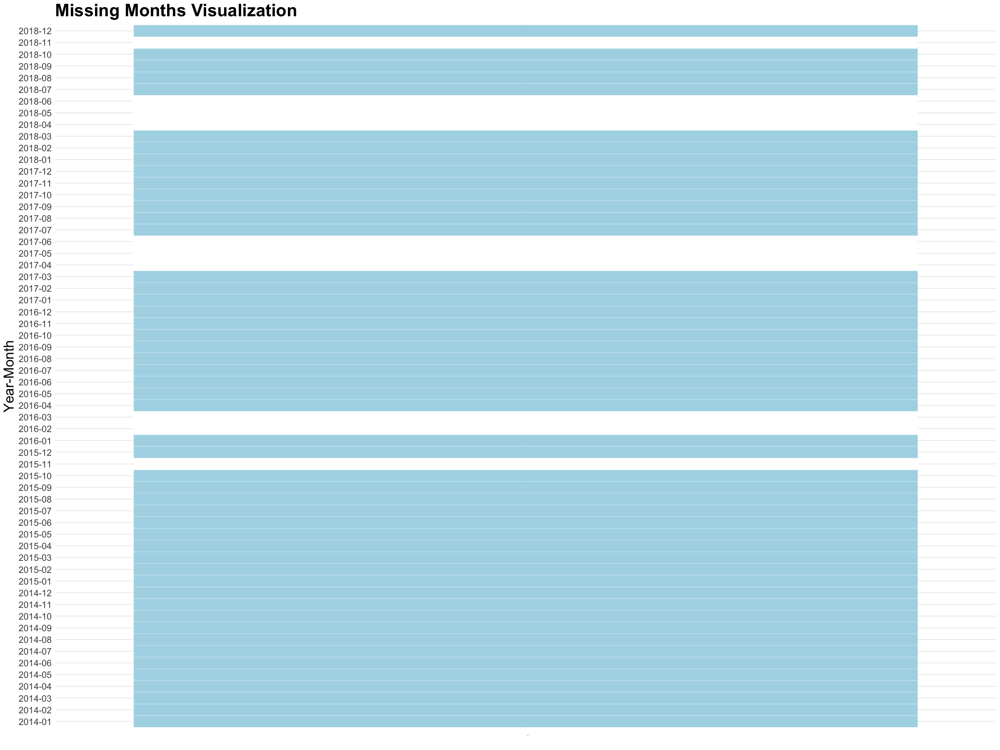

In [37]:
#Creating the vectore of month in dataset
available_month <- sort(unique(all_data$date))

# Convert the dates to the year-month format
year_month <- format(available_month, "%Y-%m")

# Create a table to count the frequency of each year-month
month_counts <- table(year_month)

# Generate a sequence of all months in the desired period
all_months <- seq(as.Date("2014-01-01"), as.Date("2018-12-01"), by = "month")
all_year_month <- format(all_months, "%Y-%m")

# Create a data frame with the full sequence of months and their counts
full_month_counts <- data.frame(year_month = all_year_month, count = 0)
full_month_counts$count <- month_counts[full_month_counts$year_month]

# Identify missing months and set their count to 0
full_month_counts$count[is.na(full_month_counts$count)] <- 0

# Reshape the data for heatmap plot
heatmap_data <- dcast(full_month_counts, year_month ~., value.var = "count")

# Set the output size
options(repr.plot.width = 20, repr.plot.height = 15)

# Create a heatmap plot
ggplot(melt(heatmap_data, id.vars = "year_month"), aes(x = variable, y = year_month)) +
  geom_tile(aes(fill = value != 0), color = "white") +
  scale_fill_manual(values = c("white", "lightblue"), guide = 'none') +
  xlab(" ") +
  ylab("Year-Month") +
  ggtitle("Missing Months Visualization") +
  theme_minimal() +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
    plot.title = element_text(size = 25, face = "bold"),
    axis.title.y = element_text(size = 20),
    axis.text.y = element_text(size = 13)
  )

### Analysis:
Considering the above visualisation, It can be understood that some month are missing duting this 5 years period. These month are, February, March, April, May, June, and November. Therefore, we should note that if we want to compare the crime rate between different years, we should remove these month in order to have an meaningful comparisson. Overall, two November, one February, one March, two April, two May, and June are missed. 

### Shifting date related column to the left

In [38]:

column_sorter <- function(all_data) {
  cols <- colnames(all_data)
  cols <- c(cols[1], cols[(length(cols)-2):length(cols)], cols[2:(length(cols)-3)])
  all_data[, cols]
}

In [39]:
all_data <- column_sorter(all_data)

In [40]:
head(all_data)

,area,month,year,date,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,...,criminal_damage_un,drugs_offences,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un
,<chr>,<chr>,<chr>,<date>,<int>,<int>,<chr>,<chr>,<chr>,<int>,...,<int>,<chr>,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>
1,National,apr,2014,2014-04-01,81,14,"7,805","2,722",698,269,...,391,"4,536",279,"3,549",654,"2,640",513,"8,283","1,314",718
2,Avon and Somerset,apr,2014,2014-04-01,1,0,167,45,36,8,...,6,135,2,68,11,66,16,188,37,24
3,Bedfordshire,apr,2014,2014-04-01,0,0,69,23,5,1,...,6,45,2,29,6,11,6,40,5,16
4,Cambridgeshire,apr,2014,2014-04-01,0,0,99,23,6,3,...,1,40,2,45,9,6,2,79,6,4
5,Cheshire,apr,2014,2014-04-01,1,1,140,47,17,3,...,9,75,10,86,7,50,6,209,12,1
6,Cleveland,apr,2014,2014-04-01,0,0,85,41,11,4,...,8,63,7,74,27,28,5,124,17,10


In [41]:
raw_data <- all_data

### Converting values to integer

Some values in the cells contain characters like *,* or *.*. So basically they are character datatype, while they are numeric representation of the features. Therefore, we must remove these extra characters and convert these data to integer

In [42]:
char_to_int  <- function(dataframe) {
  for (col in names(dataframe[,5:ncol(dataframe)])) {
    if (is.numeric(dataframe[[col]])) {
      dataframe[[col]] <- gsub(",", "", dataframe[[col]])
      dataframe[[col]] <- as.integer(dataframe[[col]])
    } else if (is.character(dataframe[[col]])) {
      dataframe[[col]] <- as.integer(gsub(",", "", dataframe[[col]]))
    }
  }
  return(dataframe)
}


In [43]:
all_data <- char_to_int(all_data)

In [44]:
head(all_data)

,area,month,year,date,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,...,criminal_damage_un,drugs_offences,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un
,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,National,apr,2014,2014-04-01,81,14,7805,2722,698,269,...,391,4536,279,3549,654,2640,513,8283,1314,718
2,Avon and Somerset,apr,2014,2014-04-01,1,0,167,45,36,8,...,6,135,2,68,11,66,16,188,37,24
3,Bedfordshire,apr,2014,2014-04-01,0,0,69,23,5,1,...,6,45,2,29,6,11,6,40,5,16
4,Cambridgeshire,apr,2014,2014-04-01,0,0,99,23,6,3,...,1,40,2,45,9,6,2,79,6,4
5,Cheshire,apr,2014,2014-04-01,1,1,140,47,17,3,...,9,75,10,86,7,50,6,209,12,1
6,Cleveland,apr,2014,2014-04-01,0,0,85,41,11,4,...,8,63,7,74,27,28,5,124,17,10


### Check if the Areaa are unique

In [45]:
glue("The number of unique area is {length(unique(all_data$area))}")
unique(all_data$area)


The number of unique area is 43

[1] "National"              "Avon and Somerset"     "Bedfordshire"         
 [4] "Cambridgeshire"        "Cheshire"              "Cleveland"            
 [7] "Cumbria"               "Derbyshire"            "Devon and Cornwall"   
[10] "Dorset"                "Durham"                "Dyfed Powys"          
[13] "Essex"                 "Gloucestershire"       "GreaterManchester"    
[16] "Gwent"                 "Hampshire"             "Hertfordshire"        
[19] "Humberside"            "Kent"                  "Lancashire"           
[22] "Leicestershire"        "Lincolnshire"          "Merseyside"           
[25] "Metropolitan and City" "Norfolk"               "Northamptonshire"     
[28] "Northumbria"           "North Wales"           "North Yorkshire"      
[31] "Nottinghamshire"       "South Wales"           "South Yorkshire"      
[34] "Staffordshire"         "Suffolk"               "Surrey"               
[37] "Sussex"                "Thames Valley"         "Warwickshire"         
[40] "West Mercia"           "West Midlands"         "West Yorkshire"       
[43] "Wiltshire"

### Region Segmentation

In [46]:
# devide all areas to three main region

region_list <- list(
  North = c("Cleveland", "Cumbria", "Durham", "Humberside", "Lancashire", "Merseyside", "Northumbria", "North Wales", "North Yorkshire", "South Yorkshire"),
  Center = c("Bedfordshire", "Cambridgeshire", "Derbyshire", "Leicestershire", "Lincolnshire", "Norfolk", "Northamptonshire", "Nottinghamshire", "Staffordshire", "Suffolk", "Warwickshire", "West Mercia"),
  South = c("Avon and Somerset", "Cheshire", "Devon and Cornwall", "Dorset", "Dyfed Powys", "Essex", "Gloucestershire", "GreaterManchester", "Gwent", "Hampshire", "Hertfordshire", "Kent", "Metropolitan and City", "South Wales", "Surrey", "Sussex", "Thames Valley", "West Midlands", "West Yorkshire", "Wiltshire"),
    All = c("National")
)


In [47]:
# Defining a function for mapping the areas to our region map
region_mapper <- function(all_data, region_list) {
    all_data$region <- ifelse(all_data$area %in% region_list$North, "North",
                        ifelse(all_data$area %in% region_list$Center, "Center",
                               ifelse(all_data$area %in% region_list$South, "South", "All")))
    return (all_data)
    }

In [48]:
all_data <- region_mapper(all_data, region_list)

In [49]:
head(all_data)

,area,month,year,date,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,...,drugs_offences,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,region
,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,National,apr,2014,2014-04-01,81,14,7805,2722,698,269,...,4536,279,3549,654,2640,513,8283,1314,718,All
2,Avon and Somerset,apr,2014,2014-04-01,1,0,167,45,36,8,...,135,2,68,11,66,16,188,37,24,South
3,Bedfordshire,apr,2014,2014-04-01,0,0,69,23,5,1,...,45,2,29,6,11,6,40,5,16,Center
4,Cambridgeshire,apr,2014,2014-04-01,0,0,99,23,6,3,...,40,2,45,9,6,2,79,6,4,Center
5,Cheshire,apr,2014,2014-04-01,1,1,140,47,17,3,...,75,10,86,7,50,6,209,12,1,South
6,Cleveland,apr,2014,2014-04-01,0,0,85,41,11,4,...,63,7,74,27,28,5,124,17,10,North


### Moving the region column next to the area

In [50]:
region_shifter <- function(all_data) {
  num_cols <- ncol(all_data)
  new_data <- all_data[, c(num_cols, 1:(num_cols - 1))]
  return(new_data)
}

In [51]:
all_data <- region_shifter(all_data)

In [52]:
head(all_data)

,region,area,month,year,date,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,...,criminal_damage_un,drugs_offences,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un
,<chr>,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,All,National,apr,2014,2014-04-01,81,14,7805,2722,698,...,391,4536,279,3549,654,2640,513,8283,1314,718
2,South,Avon and Somerset,apr,2014,2014-04-01,1,0,167,45,36,...,6,135,2,68,11,66,16,188,37,24
3,Center,Bedfordshire,apr,2014,2014-04-01,0,0,69,23,5,...,6,45,2,29,6,11,6,40,5,16
4,Center,Cambridgeshire,apr,2014,2014-04-01,0,0,99,23,6,...,1,40,2,45,9,6,2,79,6,4
5,South,Cheshire,apr,2014,2014-04-01,1,1,140,47,17,...,9,75,10,86,7,50,6,209,12,1
6,North,Cleveland,apr,2014,2014-04-01,0,0,85,41,11,...,8,63,7,74,27,28,5,124,17,10


### Another glimpse to the dataset and datatypes


In [53]:
glimpse(all_data)

Rows: 2,150
Columns: 30
$ region                                     <chr> "All", "South", "Center", "~
$ area                                       <chr> "National", "Avon and Somer~
$ month                                      <chr> "apr", "apr", "apr", "apr",~
$ year                                       <chr> "2014", "2014", "2014", "20~
$ date                                       <date> 2014-04-01, 2014-04-01, 20~
$ homicide                                   <int> 81, 1, 0, 0, 1, 0, 0, 0, 1,~
$ homicide_un                                <int> 14, 0, 0, 0, 1, 0, 0, 0, 0,~
$ offences_against_the_person                <int> 7805, 167, 69, 99, 140, 85,~
$ offences_against_the_person_un             <int> 2722, 45, 23, 23, 47, 41, 1~
$ sexual_offences                            <int> 698, 36, 5, 6, 17, 11, 8, 8~
$ sexual_offences_un                         <int> 269, 8, 1, 3, 3, 4, 1, 6, 4~
$ burglary                                   <int> 1470, 37, 16, 8, 26, 25, 12~
$ burglary_un   

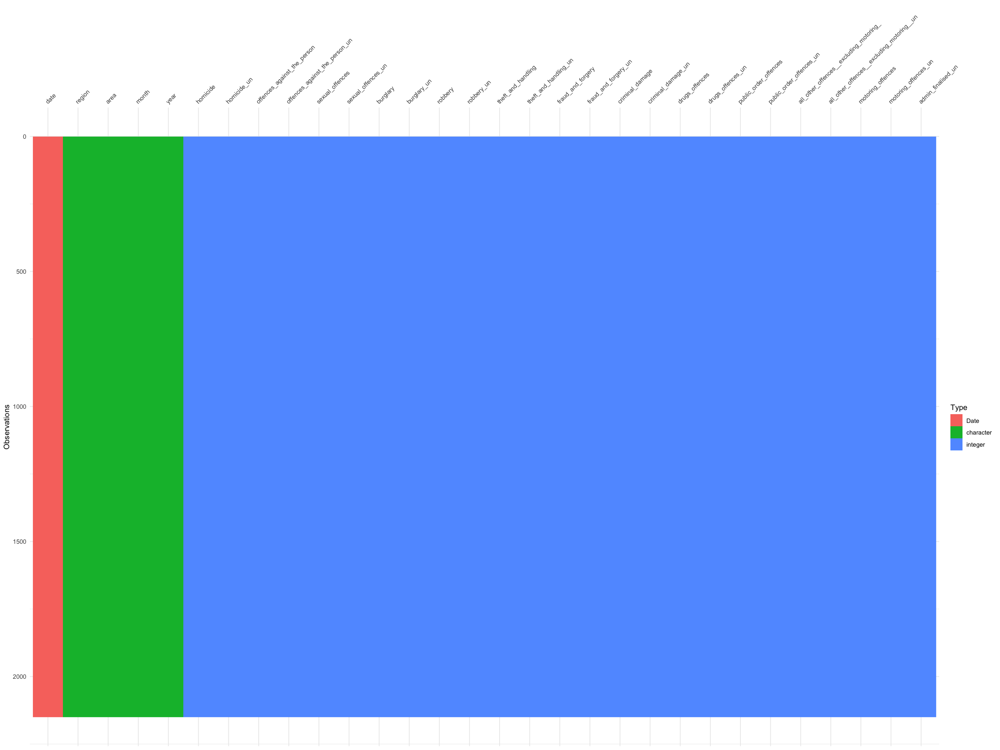

In [54]:
vis_dat(all_data)

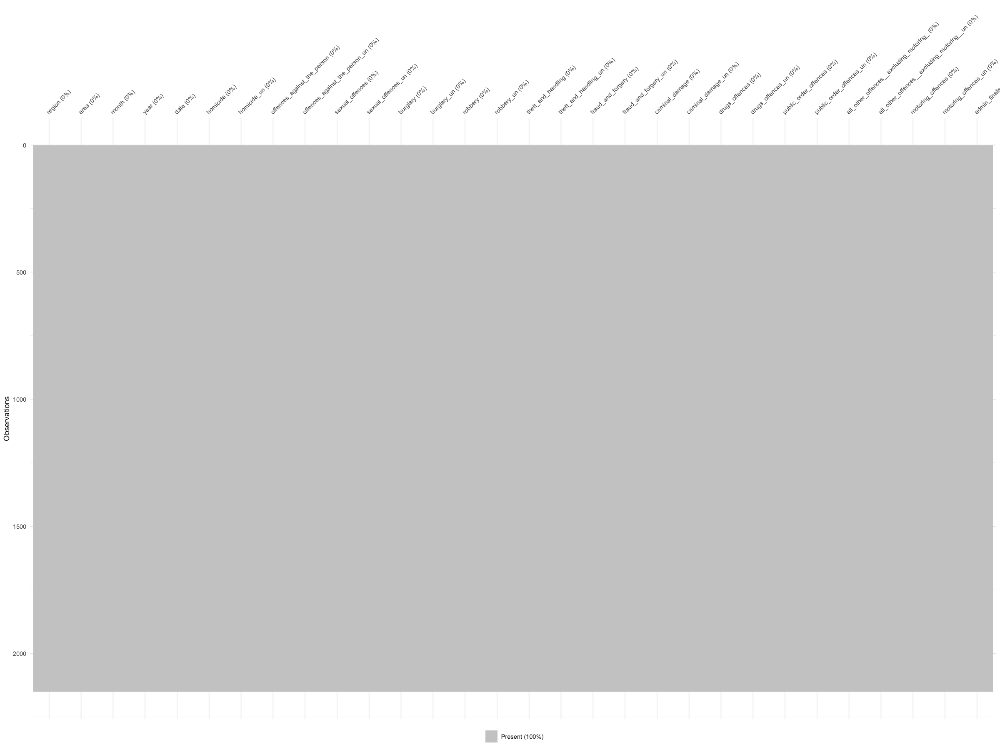

In [55]:
vis_miss(all_data)

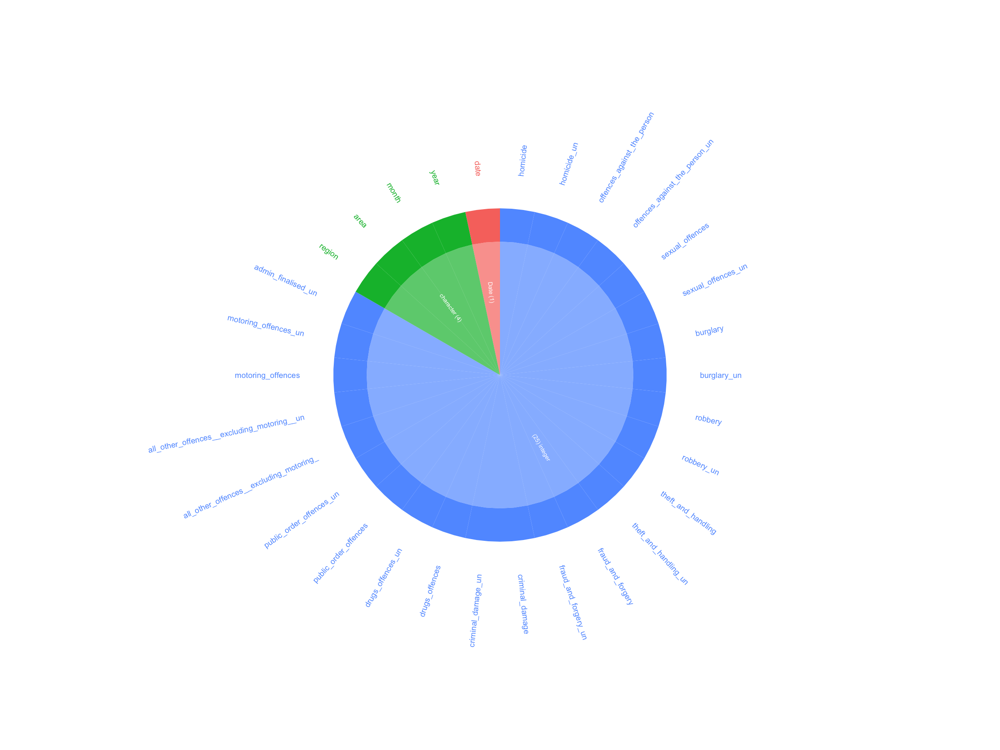

In [56]:
inspect_types(all_data) %>% show_plot()

### Conparing data type before and after data transformation

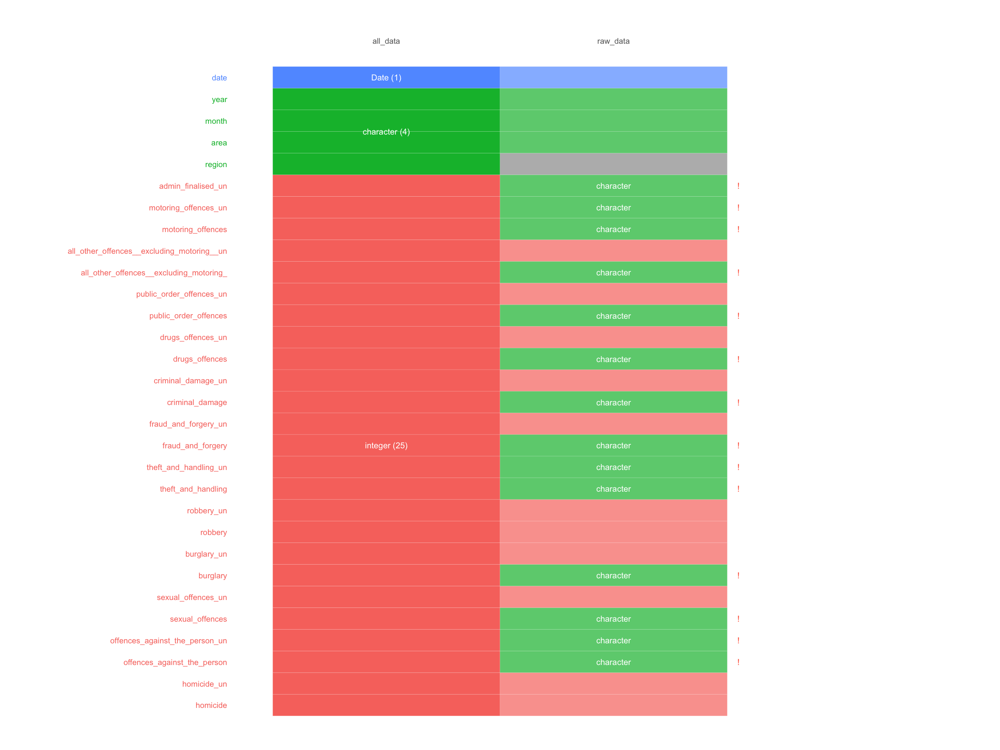

In [57]:
inspect_types(all_data, raw_data) %>% show_plot()

### Dividing the main dataframe

There is two main clusters in our dataset by default. One is for the crimes which were successful. Another one Is for the unsuccessful crimes. By spitting the main dataset to these two subsets, we can do our analysis for those different categories separately. 

In [58]:
splitter <- function(df) {
crime_columns <- !grepl("_un$", colnames(df))
  unsuccesful_columns <- grepl("_un$", colnames(df))
  unsuccesful_columns[1:5] <- TRUE
  
  return(list(df[, crime_columns], df[, unsuccesful_columns]))
}

In [59]:
splitted_dataframes <- splitter(all_data)
crime <- data.frame(splitted_dataframes[1])
ucrime <- data.frame(splitted_dataframes[2])
crime <- crime[order(crime$date), ]
ucrime <- ucrime[order(ucrime$date), ]
 

In [60]:
head(crime)

,region,area,month,year,date,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences
,<chr>,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
173,All,National,jan,2014,2014-01-01,51,9087,736,1715,522,11057,846,2693,4988,4752,3291,12945
174,South,Avon and Somerset,jan,2014,2014-01-01,0,228,35,49,8,338,18,93,148,123,63,256
175,Center,Bedfordshire,jan,2014,2014-01-01,0,68,2,7,16,75,17,22,31,30,13,171
176,Center,Cambridgeshire,jan,2014,2014-01-01,0,101,10,18,6,148,10,30,47,37,28,103
177,South,Cheshire,jan,2014,2014-01-01,0,170,15,38,10,205,14,39,64,77,50,264
178,North,Cleveland,jan,2014,2014-01-01,2,119,11,36,3,334,11,46,65,123,34,228


In [61]:
head(ucrime)

,region,area,month,year,date,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un
,<chr>,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
173,All,National,jan,2014,2014-01-01,11,2930,286,284,139,998,137,472,305,797,586,1466,890
174,South,Avon and Somerset,jan,2014,2014-01-01,0,62,17,1,0,32,0,14,4,28,9,40,20
175,Center,Bedfordshire,jan,2014,2014-01-01,1,29,1,4,7,4,3,8,3,9,2,13,12
176,Center,Cambridgeshire,jan,2014,2014-01-01,0,21,3,4,4,15,4,3,1,2,9,16,14
177,South,Cheshire,jan,2014,2014-01-01,0,40,1,5,0,5,1,3,3,8,5,16,13
178,North,Cleveland,jan,2014,2014-01-01,3,44,6,2,2,31,3,13,2,27,14,16,3


### Creating a new column which is sum of total crimes of different categories

In [62]:
sum_and_add_column <- function(df) {
  # Get the column names from column 5 to the last column
  columns_to_sum <- names(df)[6:ncol(df)]
  
  # Sum the values in the selected columns
  df$ALL <- rowSums(df[columns_to_sum])
  
  # Return the modified dataframe
  return(df)
}

In [63]:
crime <- sum_and_add_column(crime)
ucrime <- sum_and_add_column(ucrime)


In [64]:
head(crime)

,region,area,month,year,date,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
,<chr>,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
173,All,National,jan,2014,2014-01-01,51,9087,736,1715,522,11057,846,2693,4988,4752,3291,12945,52683
174,South,Avon and Somerset,jan,2014,2014-01-01,0,228,35,49,8,338,18,93,148,123,63,256,1359
175,Center,Bedfordshire,jan,2014,2014-01-01,0,68,2,7,16,75,17,22,31,30,13,171,452
176,Center,Cambridgeshire,jan,2014,2014-01-01,0,101,10,18,6,148,10,30,47,37,28,103,538
177,South,Cheshire,jan,2014,2014-01-01,0,170,15,38,10,205,14,39,64,77,50,264,946
178,North,Cleveland,jan,2014,2014-01-01,2,119,11,36,3,334,11,46,65,123,34,228,1012


In [65]:
head(ucrime)

,region,area,month,year,date,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un,ALL
,<chr>,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
173,All,National,jan,2014,2014-01-01,11,2930,286,284,139,998,137,472,305,797,586,1466,890,9301
174,South,Avon and Somerset,jan,2014,2014-01-01,0,62,17,1,0,32,0,14,4,28,9,40,20,227
175,Center,Bedfordshire,jan,2014,2014-01-01,1,29,1,4,7,4,3,8,3,9,2,13,12,96
176,Center,Cambridgeshire,jan,2014,2014-01-01,0,21,3,4,4,15,4,3,1,2,9,16,14,96
177,South,Cheshire,jan,2014,2014-01-01,0,40,1,5,0,5,1,3,3,8,5,16,13,100
178,North,Cleveland,jan,2014,2014-01-01,3,44,6,2,2,31,3,13,2,27,14,16,3,166


## Yearly Visualisation and Comparison of Crime Rates

### Pipeline:
We are going to compare the crime rate in these different years to each other. To do so, we need to sum up all the rows together with respect to their year, then put the result in a row in a new dataframe. However, for some years, we have no data for some months in our dataset, so we should drop the missing months from all years even the ones that contains these months in order to to have the same months for all the years. In this case, we make a bias on our sample as the dropped months are not following a standard randomized sampling method. Therefore, we should note that we can't confidently agree that the trends and patterns in population follow the patterns in our sample.

## Comparing the crime rate in different years

### Stacked bar plots:

#### Successful crimes

In [66]:
# Define a function to group our data by the years
group_by_year <- function(dataframe){
  dataframe <- dataframe[,-c(1,2,3,5)]
  dataframe <- group_by(dataframe, year)
  summarise_all(dataframe, list(sum))
}

In [67]:
# Select the months with data available for all the years
splitted_df <- crime[!crime$month %in% c('feb', 'mar', 'apr', 'may','jun', 'nov'), ]
splitted_df <- group_by_year(splitted_df)
head(splitted_df)

year,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
2014,720,109694,9798,18936,6512,121858,9050,29878,54542,51594,31902,108480,552964
2015,872,125612,11342,16568,5042,103858,9872,27614,49994,43644,16676,97786,508880
2016,1084,125054,12584,14296,4314,86844,10782,22858,48068,39396,8496,86784,460560
2017,1072,116352,12000,13298,4014,75120,10104,20674,41728,36888,8742,83862,423854
2018,1088,115208,11798,13110,4112,72112,10080,20398,41372,36744,8870,83900,418792


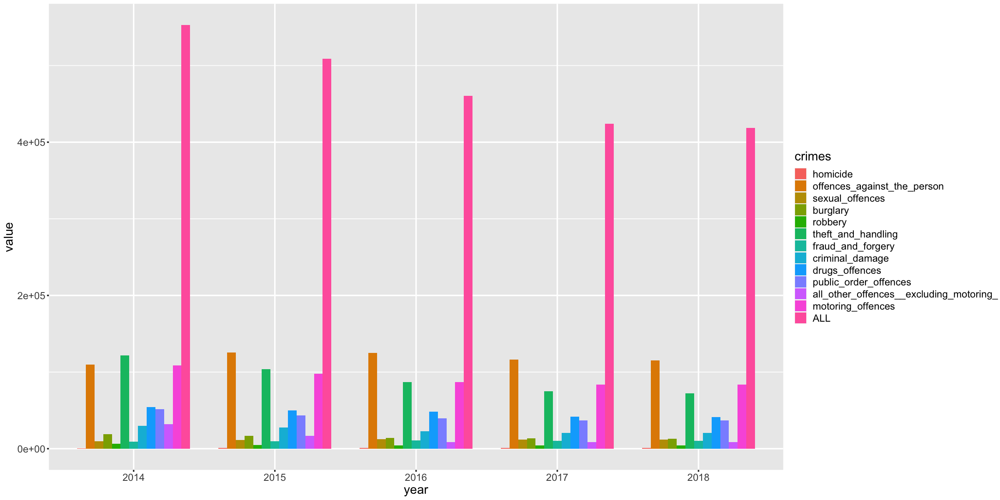

In [68]:
df <- melt(splitted_df ,  id.vars = 'year', variable.name = 'crimes')
options(repr.plot.width = 20, repr.plot.height =10)
ggplot(df,aes(x = year, y = value)) + 
geom_bar(aes(fill = crimes),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))
     

### Analysis:
This chart compares the crime rate of different indexes for years between 2014 and 2018. As is shown, the overall crime rate has decreased moderately since 2014 to 2017. The number of crimes is not significant in this comparison as we dropped February, March, April, May, June, and November month from our dataset because in some years, we had no data for those month. Nonetheless, cconsidering the ratio of the crimes, the overall number of crimes decreased more than %20 from 2014 to 2017 that is a good thing. However, from 2017 to 2018, this number almost remained steady. It is good to mention that these comparison is just valid for all crimes in our sample while some categories might follow different patterns. For instance, despite the reduction in overall number of crimes, the number of sexual_offences increased significantly. Also the number of offences agains person initially increased from 2014 to 2015, then it gradually declined. 

All in all regarding this graph, apparantly we have an improvement in overall security of the society in our sample which might indicated either security organizations outperform in comparison with previous years or the we have an inprovement in society overall mindset.  However, considering our non-standard way of sampling (dropping 5 months due to limitations in our dataset) we can't confidently conclude that our population follows the same pattern as our sample. 



#### Unsuccessful crimes

In [69]:
# Select the months with data available for all the years
u_splitted_df <- ucrime[!ucrime$month %in% c('feb', 'mar', 'apr', 'may','jun', 'nov'), ]
u_splitted_df <- group_by_year(u_splitted_df)
head(u_splitted_df)

year,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
2014,160,36928,3976,3364,1844,11734,1514,5302,3652,8800,6318,16544,9510,109646
2015,232,39340,4340,3004,1444,9878,1794,4898,3410,8066,3608,17844,10946,108804
2016,262,35844,4374,2410,1188,7624,1792,4182,3264,7076,1376,15466,10308,95166
2017,234,30950,4158,1966,1138,6442,1550,3100,2864,6140,1360,13972,10770,84644
2018,256,30522,4052,1970,1074,6292,1524,3066,2868,5948,1316,14038,11078,84004


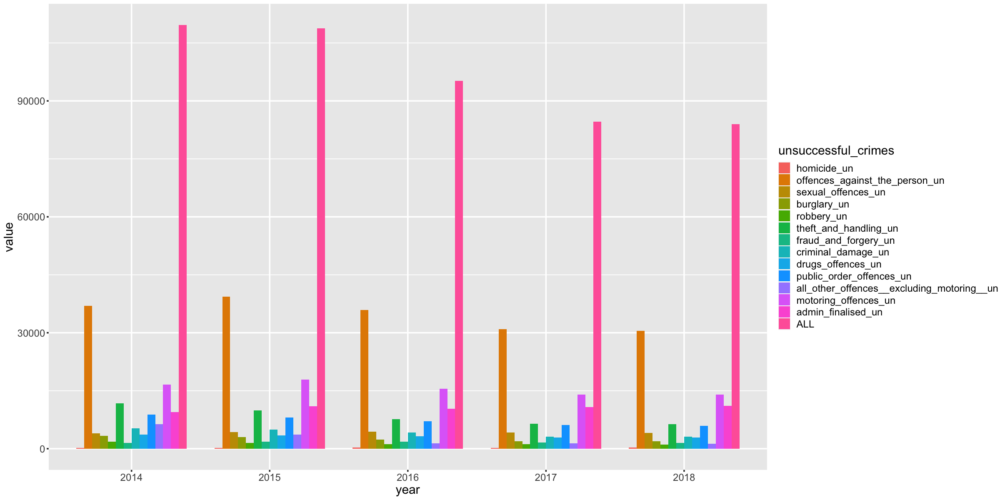

In [70]:
df <- melt(u_splitted_df ,  id.vars = 'year', variable.name = 'unsuccessful_crimes')
options(repr.plot.width = 20, repr.plot.height =10)
ggplot(df,aes(x = year, y = value)) + 
geom_bar(aes(fill = unsuccessful_crimes),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))
     

### Analysis:
This chart represent the trend of unsuccessfull crimes throughout 2014 to 2018. As is shown, by decreasing the number of successfull crimes, the number of unsuccessfull crimes reduced also. It means the the overall the ratio of the successful crimes to unsuccessful crimes should be almost the same. To assure that, we initially needs to plot overall trend of the both successfull and unsuccessfull data. Then we need to evaluate a number for this ration and track it for different years.

#### both Successful crimes and Unsuccessful crimes

In [71]:
modified_all_data <- sum_and_add_column(all_data)

In [72]:
# Select the months with data available for all the years
all_splitted_df <- modified_all_data[!modified_all_data$month %in% c('feb', 'mar', 'apr', 'may','jun', 'nov'), ]
head(group_by_year(all_splitted_df))

year,homicide,homicide_un,offences_against_the_person,offences_against_the_person_un,sexual_offences,sexual_offences_un,burglary,burglary_un,robbery,...,drugs_offences,drugs_offences_un,public_order_offences,public_order_offences_un,all_other_offences__excluding_motoring_,all_other_offences__excluding_motoring__un,motoring_offences,motoring_offences_un,admin_finalised_un,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
2014,720,160,109694,36928,9798,3976,18936,3364,6512,...,54542,3652,51594,8800,31902,6318,108480,16544,9510,662610
2015,872,232,125612,39340,11342,4340,16568,3004,5042,...,49994,3410,43644,8066,16676,3608,97786,17844,10946,617684
2016,1084,262,125054,35844,12584,4374,14296,2410,4314,...,48068,3264,39396,7076,8496,1376,86784,15466,10308,555726
2017,1072,234,116352,30950,12000,4158,13298,1966,4014,...,41728,2864,36888,6140,8742,1360,83862,13972,10770,508498
2018,1088,256,115208,30522,11798,4052,13110,1970,4112,...,41372,2868,36744,5948,8870,1316,83900,14038,11078,502796


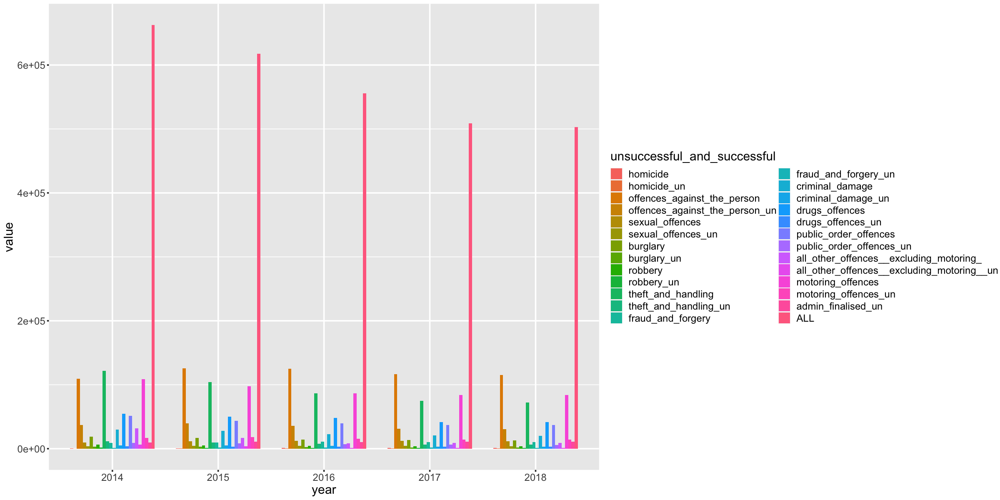

In [73]:
df <- melt(group_by_year(all_splitted_df) ,  id.vars = 'year', variable.name = 'unsuccessful_and_successful')
options(repr.plot.width = 20, repr.plot.height =10)
ggplot(df,aes(x = year, y = value)) + 
geom_bar(aes(fill = unsuccessful_and_successful),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))
     

### Analysis:
Apparantly, the sum of both successful and unsuccessful crimes followed the same trends of individual clusters. Therefore, it is expected that the ratio of successful to unsuccesful crimes wouldn't change that much. As a result, for further visualisations, we can use successful crime rates and crime rate words interchangably.

### Stacked Area Charts for different areas

#### Successful crimes

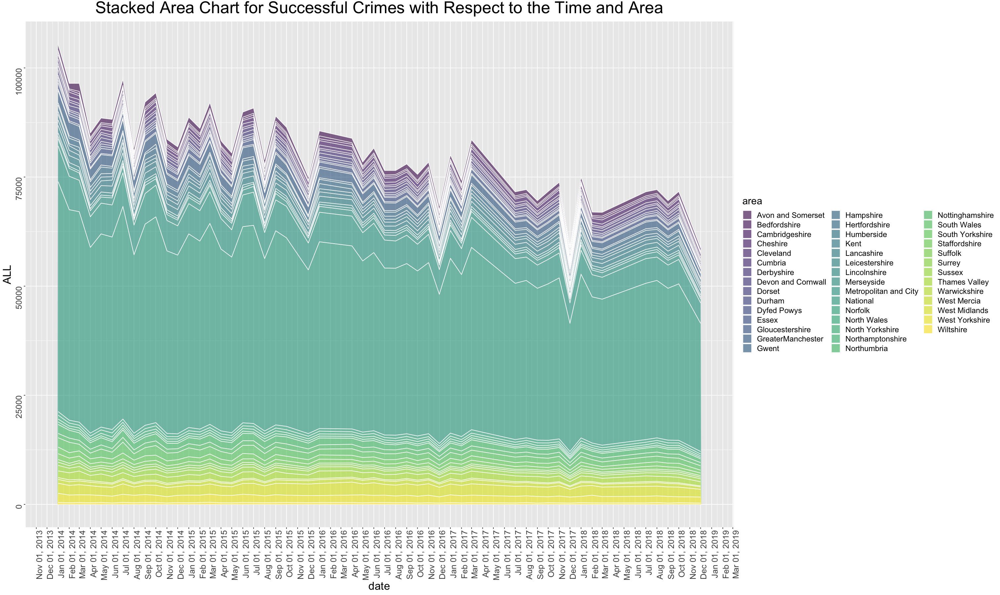

In [74]:
options(repr.plot.width = 25.2, repr.plot.height = 15)
ggplot(crime, aes(x = date, y = ALL, fill = area)) +
  geom_area(alpha = 0.6, linewidth = 0.5, colour = "white") +
  scale_x_date(date_labels = "%b %d, %Y", date_breaks = "1 month") +
  scale_fill_viridis(discrete = TRUE) +
  labs(title = "Stacked Area Chart for Successful Crimes with Respect to the Time and Area") +
  theme(plot.title = element_text(size = 30, hjust = 0.5, vjust = 1.5),
    legend.text = element_text(size = 14),
    legend.title = element_text(size = 18),
    axis.text = element_text(angle = 90, hjust = 1, size = 15),
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20),
    )


### Analysis:
This stacked area chart shows the crime rate pattern of the England And the wales, also the a visually proportion of each area from 2014 to 2018. The Y-axis represents the sum of all crimes in a specific time, while the X-aixs stans for the timeline. This chart offers a better visualization for the amount and the pattern of total crimes for different times. Previous bar charts only represented a discrete general trend of crimes on a yearly basis, Also they were biased on 6 months as we dropped months with no data from our dataset. However, this chart illustrates a continuous visualisation of our data that enables us interpret it more accurately.

Therefore, regardless of them we can understand that throughout this period the crime rate was it its highest point, while it decreased gradually more than %25. This decline in crime rate can have many different reasons, nonetheless, the overall circumstance in term of social security improved.

#### Unsuccessful crimes

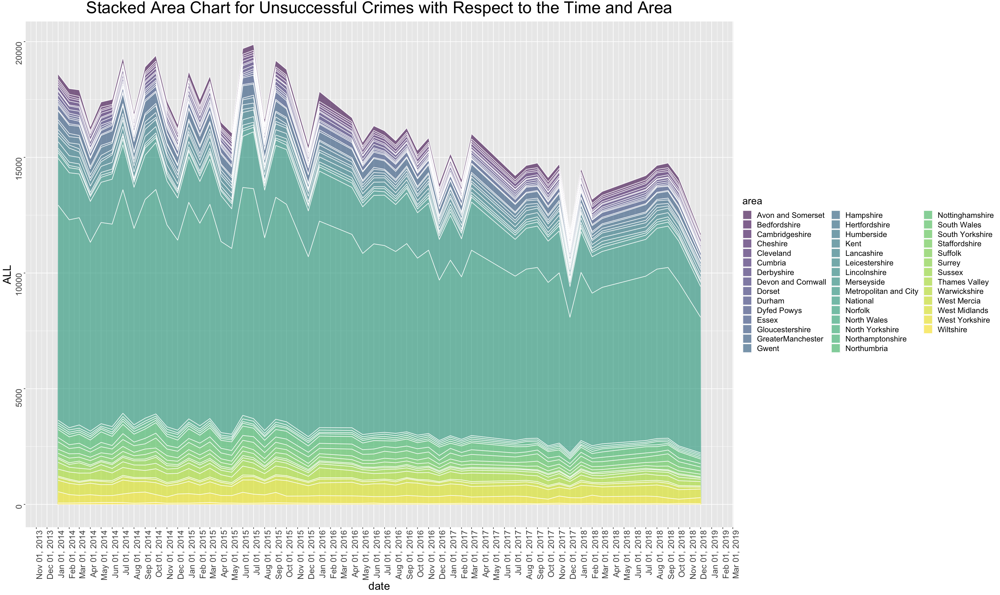

In [75]:
options(repr.plot.width = 25.2, repr.plot.height = 15)
ggplot(ucrime, aes(x = date, y = ALL, fill = area)) +
  geom_area(alpha = 0.6, linewidth = 0.5, colour = "white") +
 scale_x_date(date_labels = "%b %d, %Y", date_breaks = "1 month")+
  scale_fill_viridis(discrete = TRUE) +
  labs(title = "Stacked Area Chart for Unsuccessful Crimes with Respect to the Time and Area") +
  theme(plot.title = element_text(size = 30, hjust = 0.5, vjust = 1.5),
    legend.text = element_text(size = 14),
    legend.title = element_text(size = 18),
    axis.text = element_text(angle = 90, hjust = 1, size = 15),
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20),
       )


### Analysis:
As we interpreted before, the successful and unsuccessful crimes follow the same pattern as total crimes. As a result, we can find same trend as the successful crimes for the unsuccessful ones. However there are some minor differences for this trend. Although the successful crimes always experienced a downward trend, unsuccessful ones initially had a ascending momevent from the beginning of the 2014 to the middle of 2015, then it decreased moderately. In fact, its maximum value belong to the period between 2015 and 2016. To investigate more, we need to to visualize the monthly and yearly trends of the ratio between successful to unsuccessful crimes.

### Comparing successful and unsuccessful crime ratio for different years

To evaluate the ratio of the different successful crimes and unsuccessful crimes, we must divide two different the grouped dataframe by the year for successful crimes to the grouped dataframe by the year for unsuccessful cimes. Then, we will visualize it and interpret the relations between these two parameters.

In [76]:
ratio_df <- splitted_df[,-c(1)] / u_splitted_df[,-c(1,13)]

In [77]:
ratio_df

homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4.500000,2.970483,2.464286,5.629013,3.531453,10.38503,5.977543,5.635232,14.93483,5.862955,5.049383,11.406940,5.043175
3.758621,3.192984,2.613364,5.515313,3.491690,10.51407,5.502787,5.637811,14.66100,5.410860,4.621951,8.933492,4.677034
4.137405,3.488841,2.877000,5.931950,3.631313,11.39087,6.016741,5.465806,14.72672,5.567552,6.174419,8.419092,4.839544
4.581197,3.759354,2.886003,6.763988,3.527241,11.66097,6.518710,6.669032,14.56983,6.007818,6.427941,7.786630,5.007490
4.250000,3.774589,2.911649,6.654822,3.828678,11.46090,6.614173,6.652968,14.42538,6.177539,6.740122,7.573569,4.985382


In [78]:
# Create a function to add the years column to the ratio_df
insert_column <- function(column, dataset) {
  result <- cbind(column, dataset)
    colnames(result)[1] <- 'year'
  return(result)
}

In [79]:
ratio_df <- insert_column(splitted_df$year, ratio_df)
head(ratio_df)

,year,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2014,4.500000,2.970483,2.464286,5.629013,3.531453,10.38503,5.977543,5.635232,14.93483,5.862955,5.049383,11.406940,5.043175
2,2015,3.758621,3.192984,2.613364,5.515313,3.491690,10.51407,5.502787,5.637811,14.66100,5.410860,4.621951,8.933492,4.677034
3,2016,4.137405,3.488841,2.877000,5.931950,3.631313,11.39087,6.016741,5.465806,14.72672,5.567552,6.174419,8.419092,4.839544
4,2017,4.581197,3.759354,2.886003,6.763988,3.527241,11.66097,6.518710,6.669032,14.56983,6.007818,6.427941,7.786630,5.007490
5,2018,4.250000,3.774589,2.911649,6.654822,3.828678,11.46090,6.614173,6.652968,14.42538,6.177539,6.740122,7.573569,4.985382


In [80]:
# Plotting the yearly ratio of successful and unsuccessful crime

plot_df <- data.frame(
  year = ratio_df$year,
  value = ratio_df$ALL
)

options(repr.plot.width = 25.2, repr.plot.height = 15)

# Create the bar plot with adjusted width
yearly_ratio <- ggplot(plot_df, aes(x = year, y = value)) +
  geom_bar(stat = "identity", width = 0.2, fill = "cyan") +
  labs(title = "Yearly Ratio of Successful and Unsuccessful Crime") +
  labs(x = "Year", y = "Ratio") +
  theme_minimal() +
  theme(axis.text = element_text(size = 15), axis.title = element_text(size = 18),
       plot.title = element_text(size = 30, hjust = 0.5, vjust = 1.5))  # Adjust the size as desired


In [81]:
# Plotting the monthly ratio of successful and unsuccessful crime

# Slicing dataframe and creating a dataframe of the ratio
u_grouped_by_date <- filter(ucrime, area == "National")[,-c(1,2,3,4)]
grouped_by_date <- filter(crime, area == "National")[,-c(1,2,3,4)]
monthly_ratio_df <- u_grouped_by_date[,c(1,2)]
monthly_ratio_df$ALL <- grouped_by_date[,14]/u_grouped_by_date[,15]

plot_df <- data.frame(
  month = monthly_ratio_df$date,
  value = monthly_ratio_df$ALL
)

options(repr.plot.width = 25.2, repr.plot.height = 15)

# Create the bar plot with adjusted width

monthly_ratio <- ggplot(plot_df, aes(x = month, y = value)) +
  geom_bar(stat = "identity", width = 25, fill = "#69b3a2") +
  labs(title = "Monthly Ratio of Successful and Unsuccessful Crime") +
  scale_x_date(date_labels = "%b %d, %Y", date_breaks = "1 month") +
  labs(x = "month", y = "Ratio") +
  theme_minimal() +
  theme(axis.text = element_text(angle = 90, hjust = 1, size = 15),
        axis.title = element_text(size = 18),
        plot.title = element_text(size = 30, hjust = 0.5, vjust = 1.5))


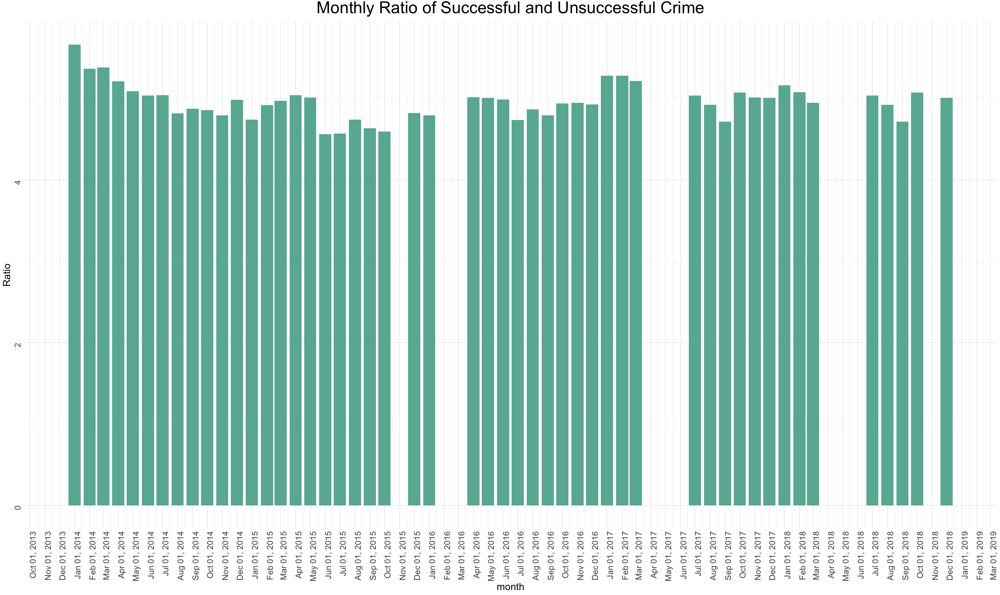

In [82]:
monthly_ratio

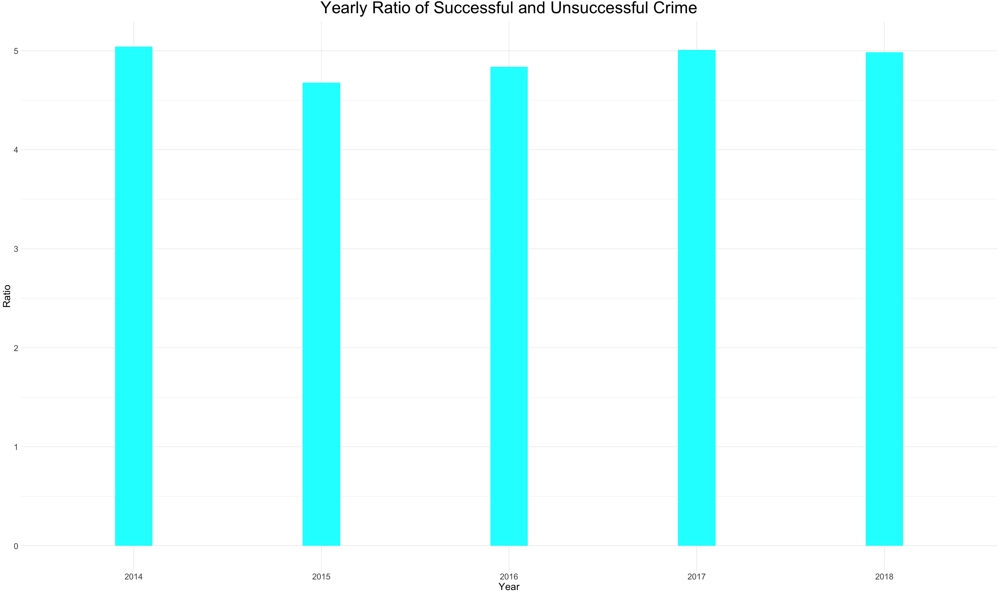

In [83]:
yearly_ratio

### Analysis:
This chart illustrates the ratio between the number of successful and unsuccessful crimes. Throughout the period from 2014 to 2018, this ratio was at its highest point at above 5 at 2014. However, it reduced moderately at its lowest point in the next year which was a good progress. And then, it sarted to increase gradually since 2015 to 2017, and it almost maintained to its initial during the following year. The lower this number the better performance of the police is. Consequently, we can tell the security organizations worked at their peformance in 2015, while their performances declined gently for the rest of this period.

## Monthly Visualisation and Comparison of Crime Rates

### Pipeline:
We are going to compare the crime rate for different month to each other. To do so, we need to sum up all the rows together with respect to their month, then put the result in a row in a new dataframe. However, there are some missing months in our dataset. For example, our dataset contains data of the January for all these 5 years, while it just provides data for May for 3 years. Consequently, By summing up the rows corresponding to the same month, the result for different months are different as different month has different weights on our dataset. 

To solve this issue we have to take an average of each month. To do so, we need to divide all the numbers corresponding to different categories of the crime in a specific month by the number of years contains this  month. For instance, after summing up all the rows corresponding to the May, we should count how many years contains May (in our case this is 3), and then devide the result but 3. By this action, we remove the bias in our data, so we can make a valid analysis.

### Monthly Successful Crime visualisation

In [84]:
# Define a function to group our data by the months
group_by_month <- function(dataframe){
  dataframe <- dataframe[,-c(1,2,4,5)]
  dataframe <- group_by(dataframe, month)
  summarise_all(dataframe, list(sum))
}

In [85]:
crime_grouped_by_months <- group_by_month(crime)
crime_grouped_by_months <- crime_grouped_by_months[order(crime_grouped_by_months$month), ]
crime_grouped_by_months

month,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
apr,580,57628,5406,7974,2678,54782,5020,13010,25994,21226,10708,47298,252304
aug,536,96610,9442,12080,3814,73440,7934,20068,37674,34782,12410,72738,381528
dec,934,88562,9054,11120,3558,67284,7446,16784,34630,28568,9172,65624,342736
feb,562,73744,6946,10462,3490,65996,6482,16318,32366,26816,12810,67834,323826
jan,724,102642,9170,13562,4238,86544,8900,22360,42994,38352,14994,90320,434800
jul,1014,102588,10034,13268,4400,79060,8576,21460,41122,35716,13352,77378,407968
jun,490,60096,5688,8060,2774,54878,4790,13916,26124,22792,10590,49560,259758
mar,624,78370,7366,11018,3648,70042,6990,16932,33696,28142,12996,69200,339024
may,526,55428,5232,8010,2674,53802,4694,13160,24608,21810,10476,47040,247460


In [86]:
month_sorter <- function(dataframe){
    real_order_of_months <- c("jan", "feb", "mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec")

    # Convert the "Month" column to a factor with the custom ordering
    dataframe$month <- factor(dataframe$month, levels = real_order_of_months)

    # Sort the dataframe based on the custom ordering of the "Month" column
    dataframe <- dataframe[order(dataframe$month), ]

    return (dataframe)
    }


In [87]:
crime_grouped_by_months <- month_sorter(crime_grouped_by_months)
crime_grouped_by_months

month,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
jan,724,102642,9170,13562,4238,86544,8900,22360,42994,38352,14994,90320,434800
feb,562,73744,6946,10462,3490,65996,6482,16318,32366,26816,12810,67834,323826
mar,624,78370,7366,11018,3648,70042,6990,16932,33696,28142,12996,69200,339024
apr,580,57628,5406,7974,2678,54782,5020,13010,25994,21226,10708,47298,252304
may,526,55428,5232,8010,2674,53802,4694,13160,24608,21810,10476,47040,247460
jun,490,60096,5688,8060,2774,54878,4790,13916,26124,22792,10590,49560,259758
jul,1014,102588,10034,13268,4400,79060,8576,21460,41122,35716,13352,77378,407968
aug,536,96610,9442,12080,3814,73440,7934,20068,37674,34782,12410,72738,381528
sep,726,100368,9982,12874,4276,75786,8200,20610,38940,35840,13194,77500,398296


In [88]:
# This function gets the grouped_by dataframe, and devide all each month by the number of month
# available in the dataset. It helps to get an average crime number for each month in each segment
# two November, one February, one March, two April, two May, and June are missed.

divide_rows_by_weights <- function(dataframe) {
    
  # this is the number of month for each month. 
    num_months_in_5year <- c(5, 4, 4, 3, 3, 3, 5, 5, 5, 5, 3, 5)
    
    dataframe[, -1] <- sweep(dataframe[, -1], 1, num_months_in_5year, "/")
    
    return (dataframe)
}

In [89]:
average_crime_monthly <- divide_rows_by_weights(crime_grouped_by_months)
average_crime_monthly

month,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
jan,144.8000,20528.40,1834.0,2712.400,847.6000,17308.80,1780.000,4472.000,8598.800,7670.400,2998.800,18064.0,86960.00
feb,140.5000,18436.00,1736.5,2615.500,872.5000,16499.00,1620.500,4079.500,8091.500,6704.000,3202.500,16958.5,80956.50
mar,156.0000,19592.50,1841.5,2754.500,912.0000,17510.50,1747.500,4233.000,8424.000,7035.500,3249.000,17300.0,84756.00
apr,193.3333,19209.33,1802.0,2658.000,892.6667,18260.67,1673.333,4336.667,8664.667,7075.333,3569.333,15766.0,84101.33
may,175.3333,18476.00,1744.0,2670.000,891.3333,17934.00,1564.667,4386.667,8202.667,7270.000,3492.000,15680.0,82486.67
jun,163.3333,20032.00,1896.0,2686.667,924.6667,18292.67,1596.667,4638.667,8708.000,7597.333,3530.000,16520.0,86586.00
jul,202.8000,20517.60,2006.8,2653.600,880.0000,15812.00,1715.200,4292.000,8224.400,7143.200,2670.400,15475.6,81593.60
aug,107.2000,19322.00,1888.4,2416.000,762.8000,14688.00,1586.800,4013.600,7534.800,6956.400,2482.000,14547.6,76305.60
sep,145.2000,20073.60,1996.4,2574.800,855.2000,15157.20,1640.000,4122.000,7788.000,7168.000,2638.800,15500.0,79659.20


In [90]:
doughnut_plotter <- function(s) {

    # Compute percentages
    s$fraction <- s$ALL / sum(s$ALL)

    # Compute the cumulative percentages (top of each rectangle)
    s$ymax <- cumsum(s$fraction)

    # Compute the bottom of each rectangle
    s$ymin <- c(0, head(s$ymax, n=-1))

    # Compute label position
    s$labelPosition <- (s$ymax + s$ymin) / 2

    # Creating the percentage
    s$percentage <- round(s$ALL/sum(s$ALL), digits = 4)

    # Compute a good label
    s$label <- paste0(s$month, "\n %", 100*s$percentage)


   # Define the custom palette with 12 dark colors
    custom_palette <- c("#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
                        "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
                        "#1a1a1a", "#757575")
    
    options(repr.plot.width = 20, repr.plot.height = 10)
    
    # Make the plot
    ggplot(s, aes(ymax = ymax, ymin = ymin, xmax = 4, xmin = 3, fill = month)) +
      geom_rect() +
      geom_text(x = 2.3, aes(y = labelPosition, label = label, color = month), size = 6) +
      scale_fill_manual(values = custom_palette) +  # Use the custom fill palette
      scale_color_manual(values = custom_palette) +  # Use the custom color palette
      coord_polar(theta = "y") +
      xlim(c(-1, 4)) +
      theme_void() +
      theme(legend.position = "none")

    }

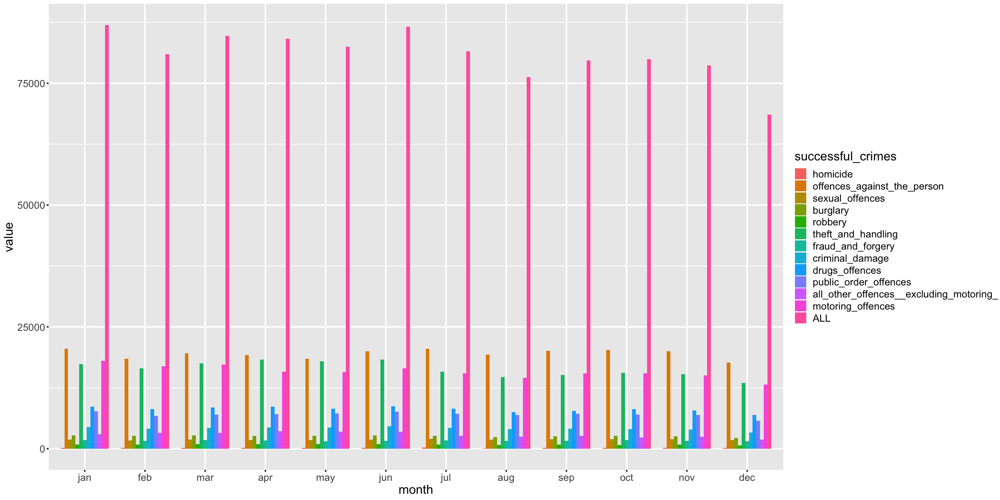

In [91]:
df <- melt(average_crime_monthly ,  id.vars = 'month', variable.name = 'successful_crimes')
options(repr.plot.width = 20, repr.plot.height =10)
ggplot(df,aes(x = month, y = value)) + 
geom_bar(aes(fill = successful_crimes),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))
     

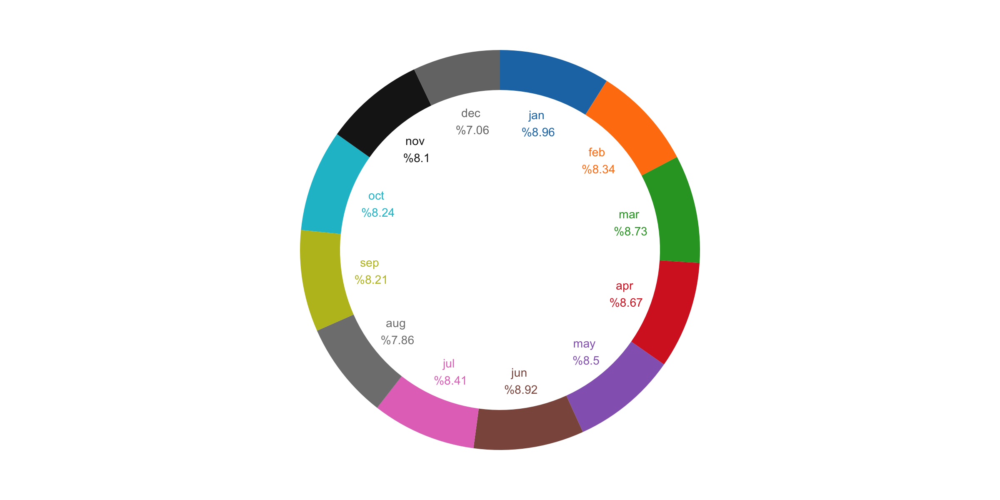

In [92]:
doughnut_plotter(average_crime_monthly)

### Analysis:
First graph represents the average number of crimes in different categories for different months during 2014 to 2018. Also, the second graph illustrates the average portion of successfull crimes for each  month. As is shown, the maximum crime rate occured in the Januarry, and June. The former includes %8.96 of all crimes, and this number is %8.92 for the latter. Throughout the year, the crime rate fluctuated between 75000 and 82500 crimes per month in most of the months. However, in December, this rate plunged to almost 62500 crimes per month that just form %7.06 of total successful crimes, which is its lowest amount during the year. Although with respect to the information in this chart it is not clear why the trend follows this pattern, we can associate this fall in December to different factors. Here is my perspective on it:

### Hypothesis:

In most cases, crimes happen in absoloute chaos or in extreme qiuetness. For example, most of the secual offences against person or coercion happen in the streets with either few or no passenger. This provide an opportunity for the criminals to approach their victim without interfere of different people. Also in these cases, the victim's chance of survival is lower as he/she can't easily ask for help due to mentioned situation. On the other hand, most of the robberis or steals happen in the chaotic places such as transportations, hubs, busy areas, etc. 

Due to the Christmas holidays, people mostly spend their time with their families and friends, businesses might be closed or their working time reduce comparing to the other months. Overrall, the cities' traffic decline in this month, consequently, the general condition of the streets are not suitable for the criminals. Their chance of success decreases, so they might prevent risking in this period. In my perspective, it might be one of the pissible reasons why the crime rate in december is at its lowest point.

On the other hand, considering these holidays, people go back to their own cities and towns. In my perspective, the criminals of a neighbourhod are not living in that neighbourhood. They prefer to crime outside of their own living area. Therefore, we can say by travelling the people to their own cities during these holidays, the number of real native inhabitant of an area grow comparing to temporary citizens. As a result, the number of crimes might fall due to this hypothesis. However to prove it, we need further analysis to agree or disagree.  


### Monthly Unuccessful Crime visualisation

In [93]:
ucrime_grouped_by_months <- group_by_month(ucrime)
ucrime_grouped_by_months <- ucrime_grouped_by_months[order(ucrime_grouped_by_months$month), ]
ucrime_grouped_by_months

month,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
apr,100,17860,2064,1422,650,4676,764,2306,1644,3780,1926,8128,4246,49566
aug,182,28474,3364,2052,1048,7054,1340,3320,2704,5970,2186,12596,8368,78658
dec,196,24932,3104,1688,910,5822,1204,3078,2452,4968,1628,10584,8734,69300
feb,146,22310,2570,1754,902,5590,1006,2812,2054,4804,2384,10038,6352,62722
jan,196,29802,3362,2338,1236,7756,1414,3780,2794,6772,2788,13526,9110,84874
jul,254,30316,3744,2274,1230,7088,1440,3506,2726,6282,2564,13758,8598,83780
jun,124,19150,2152,1564,660,5150,796,2500,1800,4160,2068,8890,4558,53572
mar,152,23910,2724,1772,960,5974,1094,2916,2314,4974,2264,10570,6360,65984
may,112,17084,2088,1368,704,4880,774,2232,1600,3930,1900,8122,4316,49110


In [94]:
ucrime_grouped_by_months <- month_sorter(ucrime_grouped_by_months)
ucrime_grouped_by_months

month,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un,ALL
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
jan,196,29802,3362,2338,1236,7756,1414,3780,2794,6772,2788,13526,9110,84874
feb,146,22310,2570,1754,902,5590,1006,2812,2054,4804,2384,10038,6352,62722
mar,152,23910,2724,1772,960,5974,1094,2916,2314,4974,2264,10570,6360,65984
apr,100,17860,2064,1422,650,4676,764,2306,1644,3780,1926,8128,4246,49566
may,112,17084,2088,1368,704,4880,774,2232,1600,3930,1900,8122,4316,49110
jun,124,19150,2152,1564,660,5150,796,2500,1800,4160,2068,8890,4558,53572
jul,254,30316,3744,2274,1230,7088,1440,3506,2726,6282,2564,13758,8598,83780
aug,182,28474,3364,2052,1048,7054,1340,3320,2704,5970,2186,12596,8368,78658
sep,116,30446,3648,2252,1142,7194,1374,3360,2660,6052,2642,13882,9114,83882


In [95]:
average_ucrime_monthly <- divide_rows_by_weights(ucrime_grouped_by_months)
average_ucrime_monthly

month,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un,ALL
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
jan,39.20000,5960.400,672.4000,467.6000,247.2000,1551.200,282.8000,756.0000,558.8000,1354.400,557.6000,2705.200,1822.000,16974.80
feb,36.50000,5577.500,642.5000,438.5000,225.5000,1397.500,251.5000,703.0000,513.5000,1201.000,596.0000,2509.500,1588.000,15680.50
mar,38.00000,5977.500,681.0000,443.0000,240.0000,1493.500,273.5000,729.0000,578.5000,1243.500,566.0000,2642.500,1590.000,16496.00
apr,33.33333,5953.333,688.0000,474.0000,216.6667,1558.667,254.6667,768.6667,548.0000,1260.000,642.0000,2709.333,1415.333,16522.00
may,37.33333,5694.667,696.0000,456.0000,234.6667,1626.667,258.0000,744.0000,533.3333,1310.000,633.3333,2707.333,1438.667,16370.00
jun,41.33333,6383.333,717.3333,521.3333,220.0000,1716.667,265.3333,833.3333,600.0000,1386.667,689.3333,2963.333,1519.333,17857.33
jul,50.80000,6063.200,748.8000,454.8000,246.0000,1417.600,288.0000,701.2000,545.2000,1256.400,512.8000,2751.600,1719.600,16756.00
aug,36.40000,5694.800,672.8000,410.4000,209.6000,1410.800,268.0000,664.0000,540.8000,1194.000,437.2000,2519.200,1673.600,15731.60
sep,23.20000,6089.200,729.6000,450.4000,228.4000,1438.800,274.8000,672.0000,532.0000,1210.400,528.4000,2776.400,1822.800,16776.40


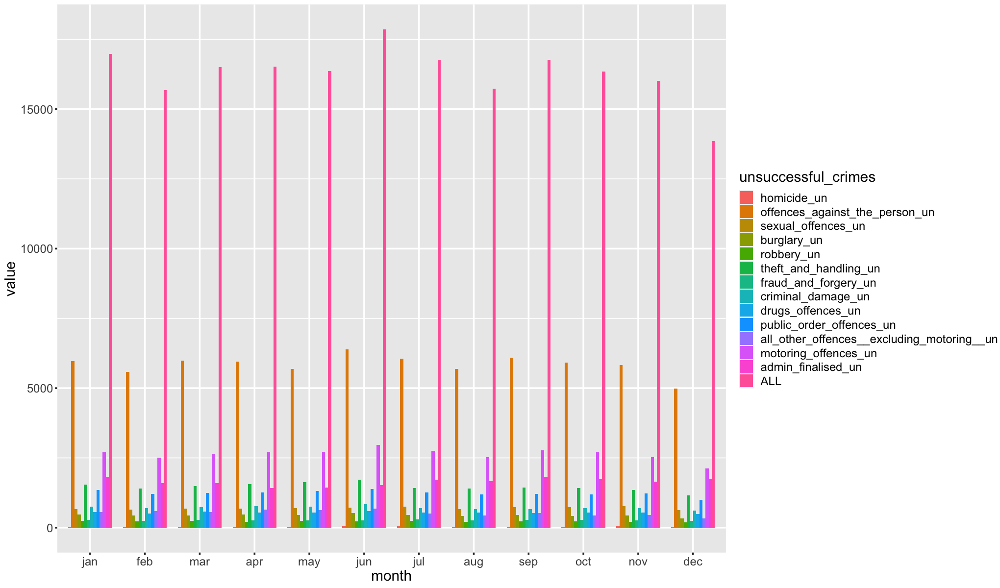

In [96]:
df <- melt(average_ucrime_monthly ,  id.vars = 'month', variable.name = 'unsuccessful_crimes')
options(repr.plot.width = 17, repr.plot.height =10)
ggplot(df,aes(x = month, y = value)) + 
geom_bar(aes(fill = unsuccessful_crimes),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))

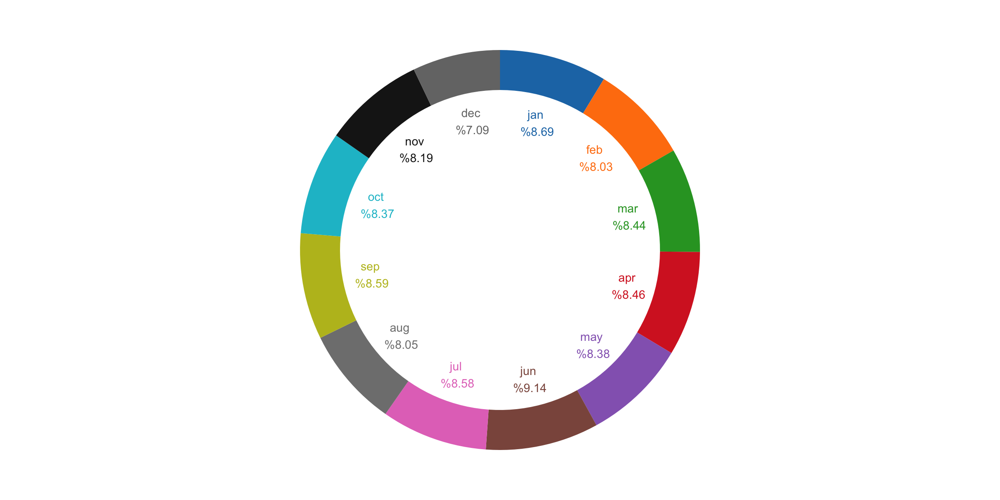

In [97]:
doughnut_plotter(average_ucrime_monthly)

### Analysis:
The analysis we used for the successul crimes works for unsuccessful ones also. The reason is that by increasing the total number of crimes regardless of being successful and unsuccessful, the number of each categories goes up. Consequently, we could anticipate our hypothesis can cover these categories as well.

## Seasonal Visualisation and Comparison of Crime Rates

### Pipeline:
In this part we use the average crime rates of different months to form the seasonal dataset. As we remove the effect of weighted month in previous section, our data here is not biased, so we can do our analysis without any further preprocessing on our dataset.

### Seasonal Comparison of Successfull Crimes

In [98]:
calculate_season_sums <- function(df, season_col) {
    
    season_months <- list(
  Winter = c("jan", "feb", "dec"),
  Spring = c("mar", "apr", "may"),
  Summer = c("jun", "jul", "aug"),
  Autumn = c("sep", "oct", "nov")
)

  seasons <- names(season_months)
  season_df <- data.frame(matrix(0, nrow = length(seasons), ncol = ncol(df)))
  
  for (i in 1:length(seasons)) {
    season <- seasons[i]
    season_cols <- which(df[[season_col]] %in% season_months[[season]])
    
    season_rows <- df[season_cols, ]
    season_sums <- colSums(season_rows[, -1], na.rm = TRUE)
    
    season_df[i, -1] <- season_sums
  }
  
  row.names(season_df) <- seasons
    colnames(season_df)[-1] <- colnames(df)[-1]
    colnames(season_df)[1] <- "Season"
    season_df$Season <- rownames(season_df)

    # Step 4: Remove the row names
    rownames(season_df) <- NULL

    
  return(season_df)
}

In [99]:
calculate_season_sums(average_crime_monthly, "month")

Season,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Winter,472.1000,56676.80,5381.3,7551.900,2431.700,47264.60,4889.700,11908.30,23616.30,20088.00,8035.70,48147.3,236463.7
Spring,524.6667,57277.83,5387.5,8082.500,2696.000,53705.17,4985.500,12956.33,25291.33,21380.83,10310.33,48746.0,251344.0
Summer,473.3333,59871.60,5791.2,7756.267,2567.467,48792.67,4898.667,12944.27,24467.20,21696.93,8682.40,46543.2,244485.2
Autumn,487.6000,60285.60,5938.4,7788.267,2398.800,45998.13,5049.067,12098.67,23702.13,21078.27,7395.60,46012.4,238232.9


In [100]:
s <- calculate_season_sums(average_crime_monthly, "month")

In [101]:
doughnut_plotter2 <- function(s){
# Compute percentages
s$fraction <- s$ALL / sum(s$ALL)

# Compute the cumulative percentages (top of each rectangle)
s$ymax <- cumsum(s$fraction)

# Compute the bottom of each rectangle
s$ymin <- c(0, head(s$ymax, n=-1))

# Compute label position
s$labelPosition <- (s$ymax + s$ymin) / 2

# Creating the percentage
s$percentage <- round(s$ALL/sum(s$ALL), digits = 4)

# Compute a good label
s$label <- paste0(s$Season, "\n percentage: %", 100*s$percentage)


# Make the plot
ggplot(s, aes(ymax=ymax, ymin=ymin, xmax=4, xmin=3, fill=Season)) +
  geom_rect() +
  geom_text( x=1.6, aes(y=labelPosition, label=label, color=Season), size=6) + # x here controls label position (inner / outer)
  scale_fill_brewer(palette="Dark2") +
  scale_color_brewer(palette="Dark2") +
  coord_polar(theta="y") +
  xlim(c(-1, 4)) +
  theme_void() +
  theme(legend.position = "none")
    }

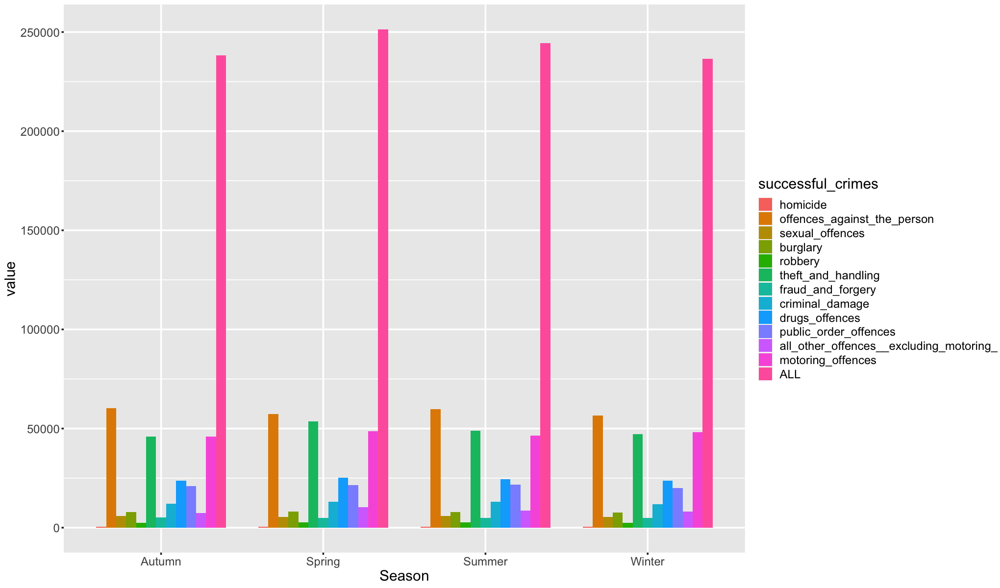

In [102]:
df <- melt(s ,  id.vars = 'Season', variable.name = 'successful_crimes')
options(repr.plot.width = 17, repr.plot.height =10)
ggplot(df,aes(x = Season, y = value)) + 
geom_bar(aes(fill = successful_crimes),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))

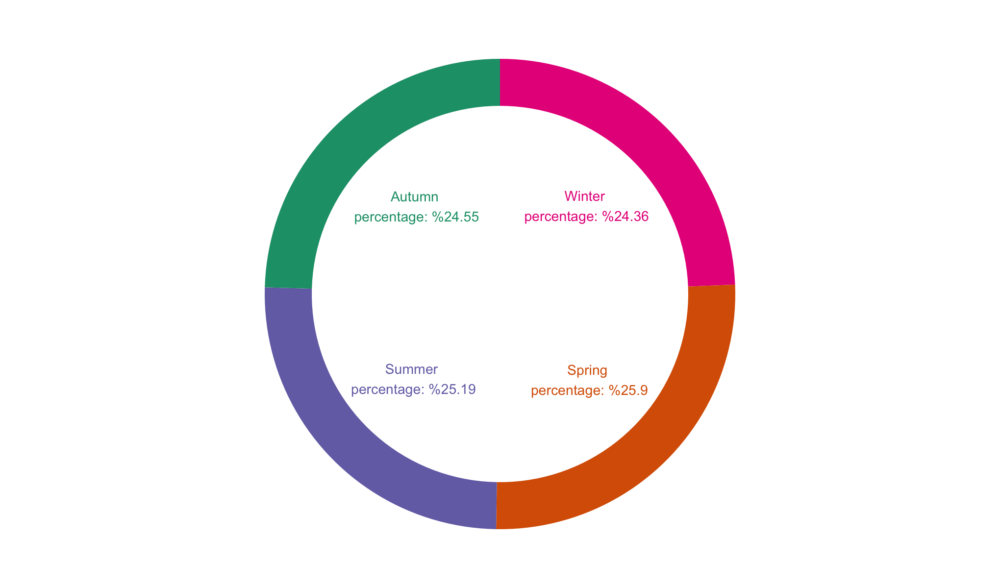

In [103]:
doughnut_plotter2(s)

### Analysis:
These charts suggests that. there is not a big difference between the crime rate iin different seasons. The proportion of crime fluctuated around %25 for all seasons. However, the Spring has the highest rate at %25.9 percent which is slightly morre than the other month. Overall we can extract meaningful information from these visualisations by itself.

### Seasonal Comparison of Unsuccessfull Crimes

In [104]:
calculate_season_sums(average_ucrime_monthly, "month")

Season,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un,ALL
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Winter,114.9000,16524.30,1935.700,1243.700,654.7000,4113.100,775.1000,2074.600,1562.700,3549.000,1479.200,7331.500,5156.800,46515.30
Spring,108.6667,17625.50,2065.000,1373.000,691.3333,4678.833,786.1667,2241.667,1659.833,3813.500,1841.333,8059.167,4444.000,49388.00
Summer,128.5333,18141.33,2138.933,1386.533,675.6000,4545.067,821.3333,2198.533,1686.000,3837.067,1639.333,8234.133,4912.533,50344.93
Autumn,117.2000,17848.00,2241.867,1315.733,653.4667,4198.667,815.8667,2078.133,1609.733,3630.933,1424.400,7998.667,5205.067,49137.73


In [105]:
us <- calculate_season_sums(average_ucrime_monthly, "month")

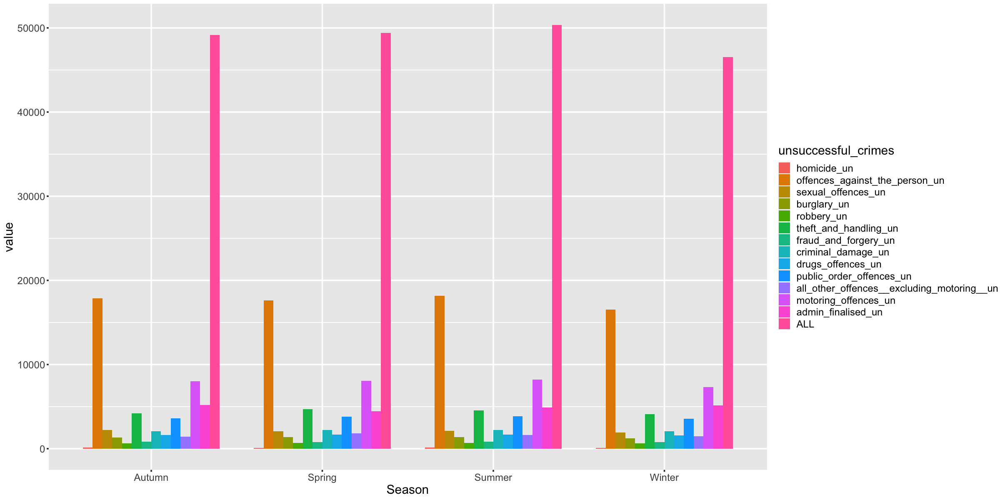

In [106]:
df <- melt(us ,  id.vars = 'Season', variable.name = 'unsuccessful_crimes')
options(repr.plot.width = 20, repr.plot.height =10)
ggplot(df,aes(x = Season, y = value)) + 
geom_bar(aes(fill = unsuccessful_crimes),stat = "identity",position = "dodge", width = 0.8) + 
theme(text = element_text(size = 18), element_line(linewidth =1))

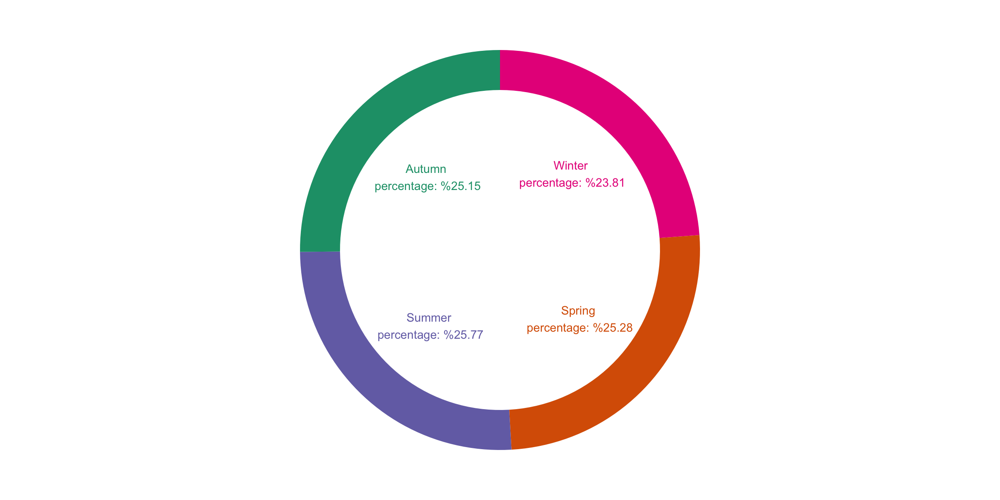

In [107]:
doughnut_plotter2(us)

## Timeline Crime Rate Visualisation:

### Stacked Line Graph for  Successful Crime Groups

In [108]:
# Create a dataframe grouped by date
grouped_by_date <- filter(crime, area == "National")[,-c(1,2,3,4,18)]
head(grouped_by_date)

,date,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences
,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,2014-01-01,51,9087,736,1715,522,11057,846,2693,4988,4752,3291,12945
2,2014-02-01,61,8366,712,1549,541,10150,758,2455,4565,3787,3208,12078
3,2014-03-01,57,8595,731,1618,569,10716,814,2413,4649,3920,2994,11155
4,2014-04-01,81,7805,698,1470,517,10045,666,2259,4536,3549,2640,8283
5,2014-05-01,69,8178,721,1562,532,10146,754,2403,4510,4022,2753,8615
6,2014-06-01,61,8444,778,1467,512,9938,708,2466,4563,4023,2743,8407


Warning message:
"Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
i Please use `linewidth` instead."


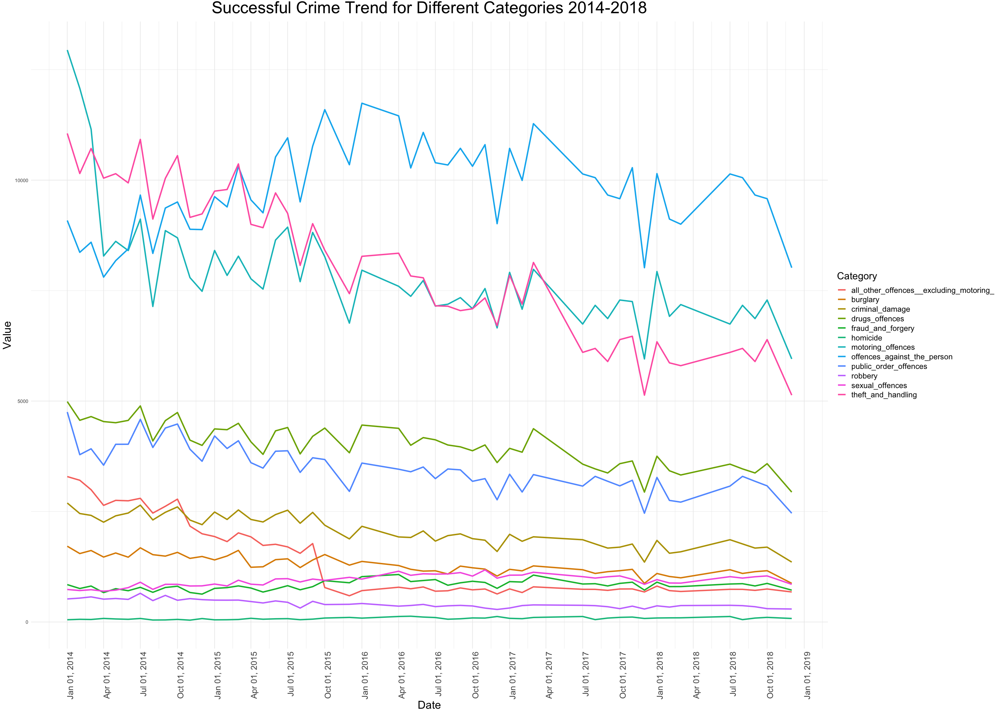

In [109]:
library(ggplot2)

df_long <- grouped_by_date %>% pivot_longer(cols = -date, names_to = "Category", values_to = "Value")


options(repr.plot.width = 25.2, repr.plot.height = 18)

# Plot the stacked line graph
ggplot(df_long, aes(x = date, y = Value, group = Category, color = Category)) +
  geom_line(size=1.2) +
  scale_x_date(date_labels = "%b %d, %Y", date_breaks = "3 month") +
  labs(x = "Date", y = "Value", title = "Successful Crime Trend for Different Categories 2014-2018") +
  theme_minimal()+
theme(axis.text.x = element_text(angle = 90, hjust = 1, size=15),
    plot.title = element_text(size = 30, hjust = 0.5, vjust = 1.5),
    axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20),
    legend.text = element_text(size = 14),
    legend.title = element_text(size = 18))


### Stacked Line Graph for  Successful Crime Groups

In [110]:
u_grouped_by_date <- filter(ucrime, area == "National")[,-c(1,2,3,4,19)]
head(u_grouped_by_date)

,date,homicide_un,offences_against_the_person_un,sexual_offences_un,burglary_un,robbery_un,theft_and_handling_un,fraud_and_forgery_un,criminal_damage_un,drugs_offences_un,public_order_offences_un,all_other_offences__excluding_motoring__un,motoring_offences_un,admin_finalised_un
,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,2014-01-01,11,2930,286,284,139,998,137,472,305,797,586,1466,890
2,2014-02-01,18,2891,288,284,163,945,111,427,292,730,597,1425,816
3,2014-03-01,22,3133,320,239,144,943,114,432,295,717,541,1425,633
4,2014-04-01,14,2722,269,226,116,840,108,391,279,654,513,1314,718
5,2014-05-01,17,2684,310,267,164,1017,127,406,312,711,510,1446,726
6,2014-06-01,18,2927,311,277,132,947,110,436,311,712,547,1361,664


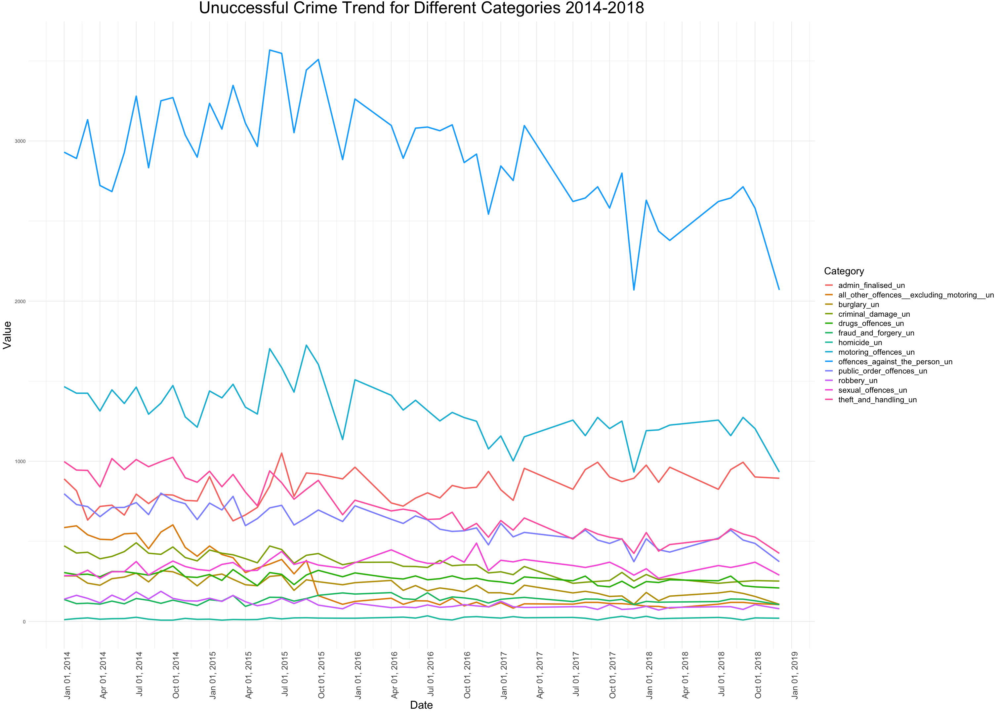

In [111]:
library(ggplot2)

df_long <- u_grouped_by_date %>% pivot_longer(cols = -date, names_to = "Category", values_to = "Value")


options(repr.plot.width = 25.2, repr.plot.height = 18)

# Plot the stacked line graph
ggplot(df_long, aes(x = date, y = Value, group = Category, color = Category)) +
  geom_line(size=1.2) +
  scale_x_date(date_labels = "%b %d, %Y", date_breaks = "3 month") +
  labs(x = "Date", y = "Value", title = "Unuccessful Crime Trend for Different Categories 2014-2018") +
  theme_minimal()+
theme(axis.text.x = element_text(angle = 90, hjust = 1, size=15),
     axis.title.x = element_text(size = 20),
    axis.title.y = element_text(size = 20),
     plot.title = element_text(size = 30, hjust = 0.5, vjust = 1.5),
     legend.text = element_text(size = 14),
    legend.title = element_text(size = 18))


## Region-Based Comparison of the Crime Rate

### Geographical Heat Map of Crime Rate for England & Wales

In [112]:
# Define a function to group our data by the area
group_by_region <- function(dataframe){
  dataframe <- dataframe[,-c(1,3,4,5)]
  dataframe <- group_by(dataframe, area)
  summarise_all(dataframe, list(sum))
}

In [113]:
grouped_by_region <- group_by_region(crime)
head(grouped_by_region)

area,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
Avon and Somerset,109,13081,2184,1704,392,11107,936,3060,4825,4225,1832,10248,53703
Bedfordshire,45,4241,291,612,348,3661,389,859,1585,1233,412,4032,17708
Cambridgeshire,53,5726,445,730,222,4440,485,1175,1718,1630,520,4265,21409
Cheshire,55,11260,983,1138,230,8513,722,1985,4118,4587,1355,9380,44326
Cleveland,45,5856,495,1593,300,11704,536,1864,2999,3501,681,4401,33975
Cumbria,20,5012,281,450,72,4242,286,1307,1770,2054,1270,4310,21074


In [114]:
# Removing the National row from the dataset
grouped_by_region = filter(grouped_by_region, area != "National")
head(grouped_by_region)


area,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
Avon and Somerset,109,13081,2184,1704,392,11107,936,3060,4825,4225,1832,10248,53703
Bedfordshire,45,4241,291,612,348,3661,389,859,1585,1233,412,4032,17708
Cambridgeshire,53,5726,445,730,222,4440,485,1175,1718,1630,520,4265,21409
Cheshire,55,11260,983,1138,230,8513,722,1985,4118,4587,1355,9380,44326
Cleveland,45,5856,495,1593,300,11704,536,1864,2999,3501,681,4401,33975
Cumbria,20,5012,281,450,72,4242,286,1307,1770,2054,1270,4310,21074


In [115]:
#Creating a dataframe contains lattitude and longitude of the different areas  
area_map <- data.frame(
  area = c("Avon and Somerset", "Bedfordshire", "Cambridgeshire", "Cheshire", "Cleveland", "Cumbria", "Derbyshire", "Devon and Cornwall", "Dorset", "Durham", "Dyfed Powys", "Essex", "Gloucestershire", "GreaterManchester", "Gwent", "Hampshire", "Hertfordshire", "Humberside", "Kent", "Lancashire", "Leicestershire", "Lincolnshire", "Merseyside", "Metropolitan and City", "Norfolk", "Northamptonshire", "Northumbria", "North Wales", "North Yorkshire", "Nottinghamshire", "South Wales", "South Yorkshire", "Staffordshire", "Suffolk", "Surrey", "Sussex", "Thames Valley", "Warwickshire", "West Mercia", "West Midlands", "West Yorkshire", "Wiltshire"),
  Longitude = c(-2.4724, -0.4713, 0.08831, -2.77264, -1.26479, -3.09273, -1.57126, -3.84036, -2.28556, -1.6176, -4.05117, 0.56873, -2.16179, -2.39688, -3.04425, -1.34453, -0.26407, -0.41604, 0.67834, -2.70649, -1.21497, -0.217, -2.93036, -0.10956, 1.00236, -0.98553, -1.66276, -3.84354, -1.08271, -1.07417, -3.50016, -1.35208, -1.91323, 1.00494, -0.47046, -0.44144, -1.12764, -1.58323, -2.62168, -1.89858, -1.64323, -1.99768),
  Latitude = c(51.38897, 52.06864, 52.38235, 53.20986, 54.5715, 54.65139, 53.12793, 50.6697, 50.75391, 54.77868, 52.06963, 51.77291, 51.86328, 53.47239, 51.74864, 51.05983, 51.80825, 53.68436, 51.23425, 53.82765, 52.67212, 53.18563, 53.41623, 51.51488, 52.63654, 52.24587, 55.14918, 53.13666, 54.22759, 53.12322, 51.59882, 53.47227, 52.87999, 52.20758, 51.29732, 50.92856, 51.61744, 52.30101, 52.32348, 52.48624, 53.78, 51.34982)
)
area_map <- area_map[order(area_map$area), ]
head(area_map)

,area,Longitude,Latitude
,<chr>,<dbl>,<dbl>
1,Avon and Somerset,-2.47240,51.38897
2,Bedfordshire,-0.47130,52.06864
3,Cambridgeshire,0.08831,52.38235
4,Cheshire,-2.77264,53.20986
5,Cleveland,-1.26479,54.57150
6,Cumbria,-3.09273,54.65139


In [116]:
# Adding the total crime number to the area_map dataframe
area_map$crime <- grouped_by_region$ALL
head(area_map)

,area,Longitude,Latitude,crime
,<chr>,<dbl>,<dbl>,<dbl>
1,Avon and Somerset,-2.47240,51.38897,53703
2,Bedfordshire,-0.47130,52.06864,17708
3,Cambridgeshire,0.08831,52.38235,21409
4,Cheshire,-2.77264,53.20986,44326
5,Cleveland,-1.26479,54.57150,33975
6,Cumbria,-3.09273,54.65139,21074


i Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under CC BY SA.



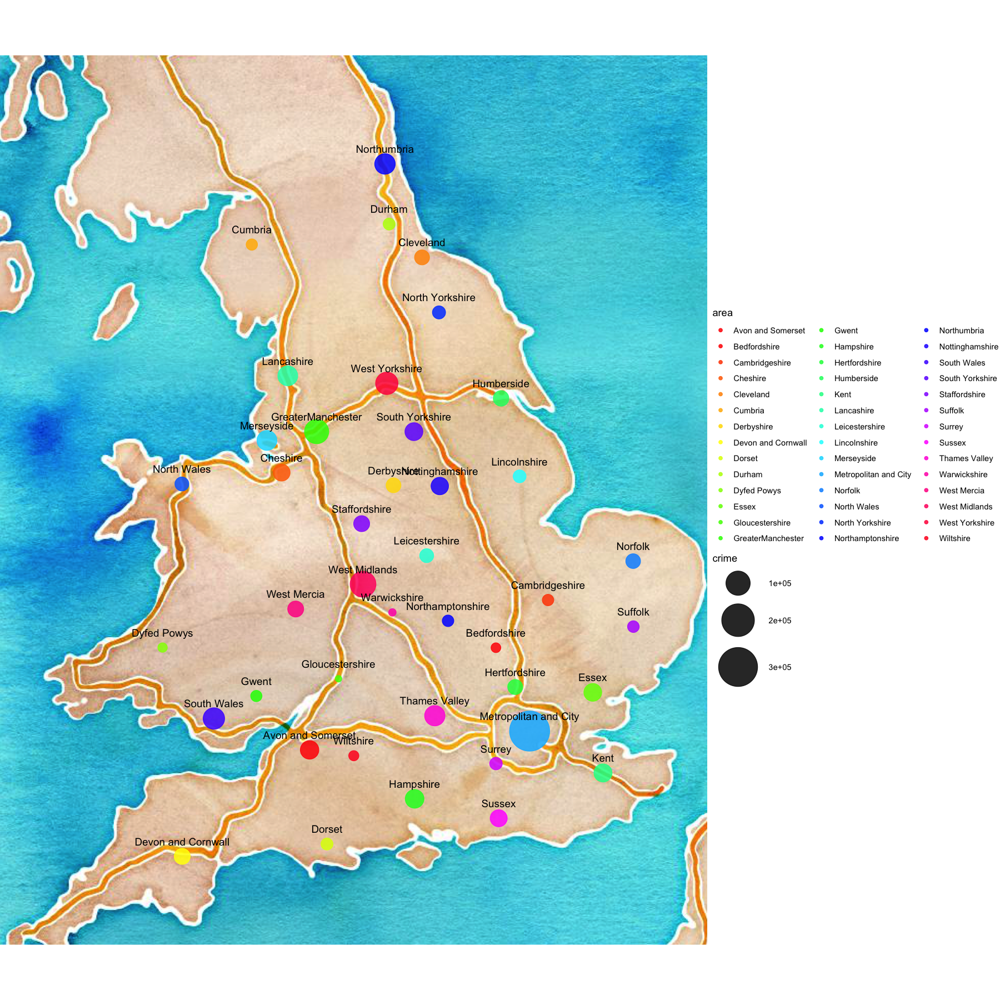

In [117]:
## library(ggplot2)
library(ggmap)

# Define the bounding box coordinates for England and Wales
ew_bbox <- c(left = -5.797, bottom = 50.064, right = 1.799, top = 55.811)

# Get the map of England and Wales using ggmap
ew_map <- get_stamenmap(ew_bbox, zoom = 7, maptype = "watercolor")

options(repr.plot.width = 15, repr.plot.height =15)

# Create a plot using ggmap and ggplot2
plot <- ggmap(ew_map, extent = "device") +
  geom_point(data = area_map, aes(x = Longitude, y = Latitude, size = crime, color = area), alpha = 0.85) +
  scale_size_continuous(range = c(3, 20)) +
  scale_color_manual(values = rainbow(length(unique(area_map$area)))) +
  geom_text(data = area_map, aes(x = Longitude, y = Latitude, label = area), vjust = -1.5, size = 4) +
  theme_void()


# Display the plot
print(plot)

### Analysis:
This heatmap is a geographical illustration of the crime rate in the wales and England. Bubbles represent areas in our map. The size of bubbles is in a direct relation with the crime rate at that area, which means the bigger bubble, the higher the crime rate is. We can see Metropolian and City area which is located in London has the biggest size amongst other hat demonstrate the massive crime rate in this region. Also we can see areas such as West Midlands, Greater Manchester,and West Yorkshire with big crime rates comparing to other areas. On the other hand, locations such as Gloucestershire and Warwickshire have the lowest crime rate as their bubble is so small.

### Stacked Circular Bargraph of Crime Rates Based on Areas

In [118]:
# Adding regions to the area_map
area_map <- region_mapper(area_map, region_list)
head(area_map)

,area,Longitude,Latitude,crime,region
,<chr>,<dbl>,<dbl>,<dbl>,<chr>
1,Avon and Somerset,-2.47240,51.38897,53703,South
2,Bedfordshire,-0.47130,52.06864,17708,Center
3,Cambridgeshire,0.08831,52.38235,21409,Center
4,Cheshire,-2.77264,53.20986,44326,South
5,Cleveland,-1.26479,54.57150,33975,North
6,Cumbria,-3.09273,54.65139,21074,North


In [119]:
# Removing Longitue and Latitude from area_map
area_map <- area_map[,-c(2,3)]
head(area_map)


,area,crime,region
,<chr>,<dbl>,<chr>
1,Avon and Somerset,53703,South
2,Bedfordshire,17708,Center
3,Cambridgeshire,21409,Center
4,Cheshire,44326,South
5,Cleveland,33975,North
6,Cumbria,21074,North


In [120]:
# Rename columns and and
colnames(area_map) <- c('individual', 'value', 'group')
data <- area_map
data <- data[order(data$value), ]
head(data)

,individual,value,group
,<chr>,<dbl>,<chr>
13,Gloucestershire,14852,South
38,Warwickshire,15115,Center
11,Dyfed Powys,17193,South
2,Bedfordshire,17708,Center
42,Wiltshire,18457,South
15,Gwent,20958,South


In [121]:
data$labeler <- paste(as.character(data$individual), '%', as.character(format(round(100 * data$value / sum(data$value), 2), nsmall = 2)), sep = '')
head(data)

,individual,value,group,labeler
,<chr>,<dbl>,<chr>,<chr>
13,Gloucestershire,14852,South,Gloucestershire% 0.74
38,Warwickshire,15115,Center,Warwickshire% 0.75
11,Dyfed Powys,17193,South,Dyfed Powys% 0.85
2,Bedfordshire,17708,Center,Bedfordshire% 0.88
42,Wiltshire,18457,South,Wiltshire% 0.92
15,Gwent,20958,South,Gwent% 1.04


In [122]:
circular_stacked_bar_plotter <- function(data){
empty_bar <- 4
to_add <- data.frame(matrix(NA, empty_bar * nlevels(data$group), ncol(data)))
colnames(to_add) <- colnames(data)
to_add$group <- rep(levels(data$group), each = empty_bar)
data <- rbind(data, to_add)
data <- data %>% arrange(group)
data$id <- seq(1, nrow(data))

# Get the name and the y position of each label
label_data <- data
number_of_bar <- nrow(label_data)
angle <- 90 - 360 * (label_data$id - 0.5) / number_of_bar
label_data$hjust <- ifelse(angle < -90, 1, 0)
label_data$angle <- ifelse(angle < -90, angle + 180, angle)

options(repr.plot.width = 18, repr.plot.height = 20)

# Make the plot
p <- ggplot(data, aes(x = as.factor(id), y = value, fill = group)) +
  geom_bar(stat = "identity", alpha = 0.5) +
  ylim(-100000, 390444) +
  theme_minimal() +
  theme(
    legend.position = "bottom",
    axis.text = element_blank(),
    axis.title = element_blank(),
    panel.grid = element_blank(),
    plot.margin = unit(rep(-1, 4), "cm"),
    plot.title = element_text(hjust = 0.5, vjust = 1, size = 25)
  ) +
  coord_polar() +
  geom_text(
    data = label_data,
    aes(x = id, y = value + 10, label = labeler, hjust = hjust),
    color = "black",
    fontface = "bold",
    alpha = 0.6,
    size = 5,
    angle = label_data$angle,
    inherit.aes = FALSE
  ) +
  labs(title = "Crime Rate Comparison of Different Areas")

  return (p)
}

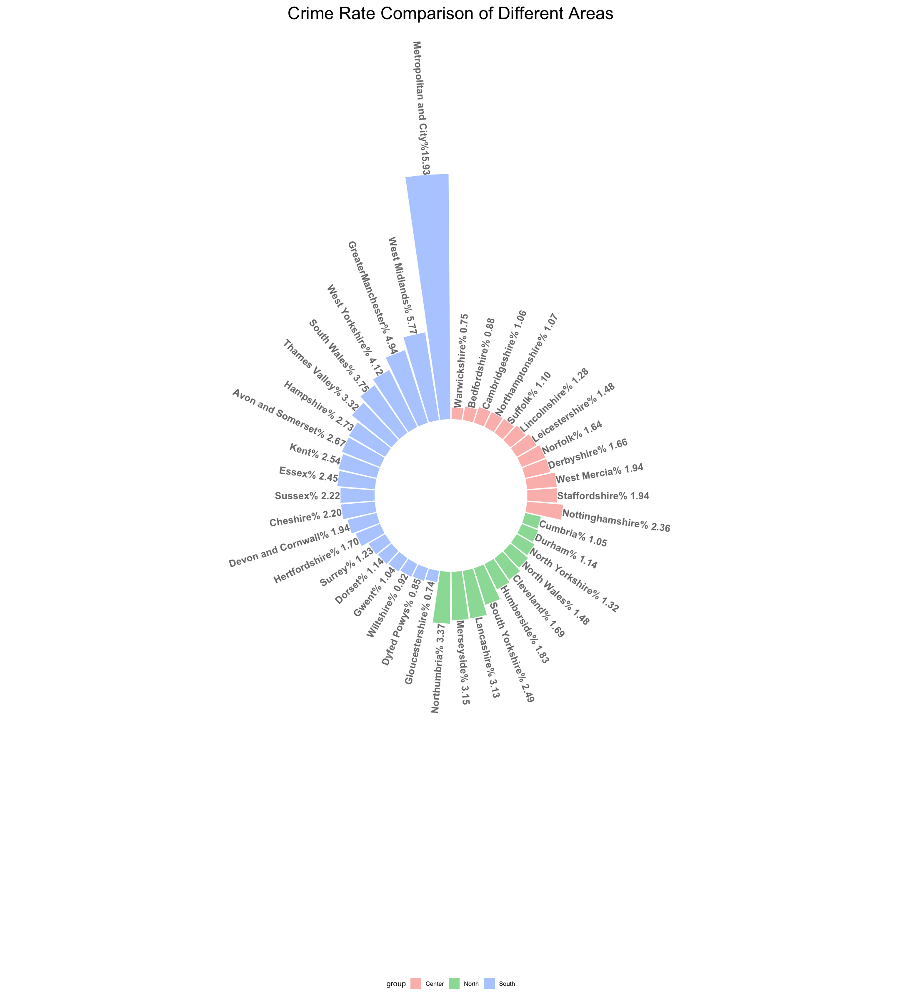

In [123]:
circular_stacked_bar_plotter(data)

### Analysis:
This stacked circular bar graph demonstrate the portion of crime rates in each area during years from 2014 to 2018. What draw our attention first is that the majority of the crimes happened in the southern part of the England and Wales. The color blue correspond to the soth region of these two country. As can be seen, the Metropolitan and City has the highest portion at %15.93 of total crimes in the UK which is significanly higher than other areas. This number seems to be rational as London belongs to this area. As a result, we can anticipate a massive city such london with its enormous population can hold this much of crimes within.

Although the crime rate in south east is too high, Gloucestershire which is the area with the lowest crime belongs to this region also. This area just accounting for %0.74 of total crime in the UK. This area also other areas such as Warwickshire with the minimum crime rate are good places to investigate that what socity differences resulted in low crime number. Although they are less populated comparing with the other areas which is the most crucial factor, there might be som other underlying reasons which contribute to this manner.

On the other hand, Central and Northern regions had low crime rates compared to the south. The highest rate in north and center belongs to Northumbia and Nottinghamshire respectively. The former accounting for %3.37, and the latter contanis %2.36 of total crime.

## Comparing The Successful & Unsuccessful Crime Ratio in Different Categories

In [124]:
ratio_plotter <- function(data1, data2){
    u_grouped_by_date <- filter(data2, area == "National")[,-c(1,2,3,4,5)]
    grouped_by_date <- filter(data1, area == "National")[,-c(1,2,3,4,5)]
    ratio_df <- grouped_by_date/u_grouped_by_date[,-c(13)]
    colnames(ratio_df)[13] <- 'Average'

    
    # Calculate column averages
    column_averages <- colMeans(ratio_df)
    
    # Convert the column_averages into a data frame
    df <- data.frame(Column = colnames(ratio_df), Ratio = column_averages)
    
    options(repr.plot.width = 25.2, repr.plot.height = 15)

    # Define the color palette
    num_shades <- nrow(df)
    green_palette <- colorRampPalette(c("lightgreen", "darkgreen"))
    green_colors <- green_palette(num_shades)

    # Create the barplot using ggplot2
    plot <- ggplot(df, aes(x = Column, y = Ratio, fill = Ratio)) +
      geom_bar(stat = "identity", width = 0.7) +
      labs(title = "Ratio of Convictioin to Unsuccessful Crimes",
           x = "Category",
           y = "Ratio") +
      scale_fill_gradient(low = "lightgreen", high = "darkgreen") +
      theme_minimal() +
      theme(plot.title = element_text(hjust = 0.5, vjust = 1, size = 40, face = "bold"),
            axis.text.x = element_text(angle = 45, hjust = 1, size = 20),
            axis.text.y = element_text( size = 15),
            axis.title = element_text(size = 30),
            legend.position = "none")
    
    return(plot)
}

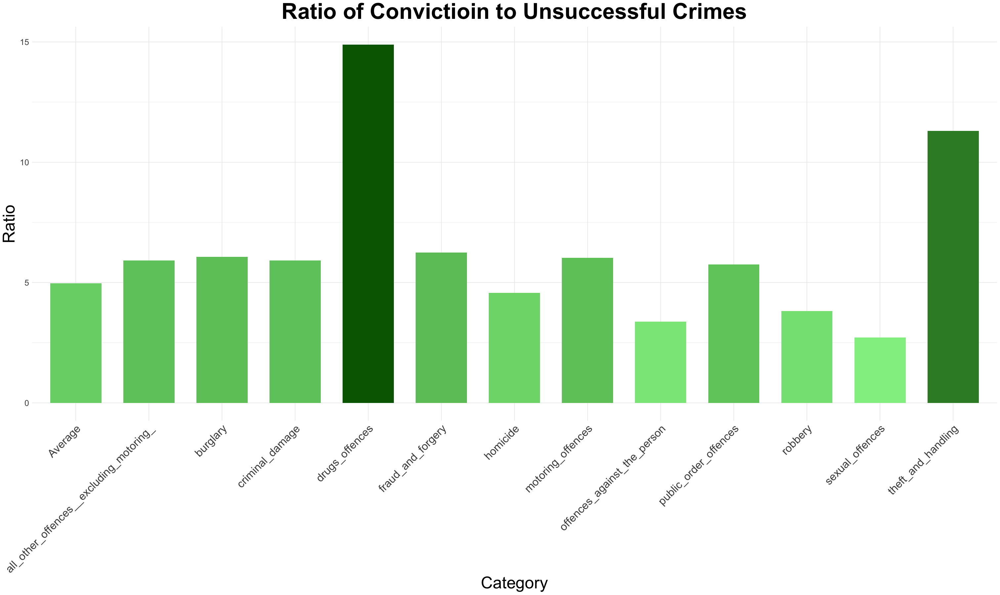

In [125]:
ratio_plotter(crime, ucrime)

### Analysis:
Government organizations which are responsible for social security especially those use preventice approaches need to 

should know the security weaknesses and strengths, and try to elevate their performance on a daily basis. They 

## Correlation Analysis

###  Scatter Plot and Correlation Between Crime Categories

In [126]:
correlation_maker <- function(data){
options(repr.plot.width = 25.2, repr.plot.height = 15)
plot <- ggpairs(data[,-c(1,2,3,4,5)] , title="correlogram with ggpairs()") 
return (plot)
}

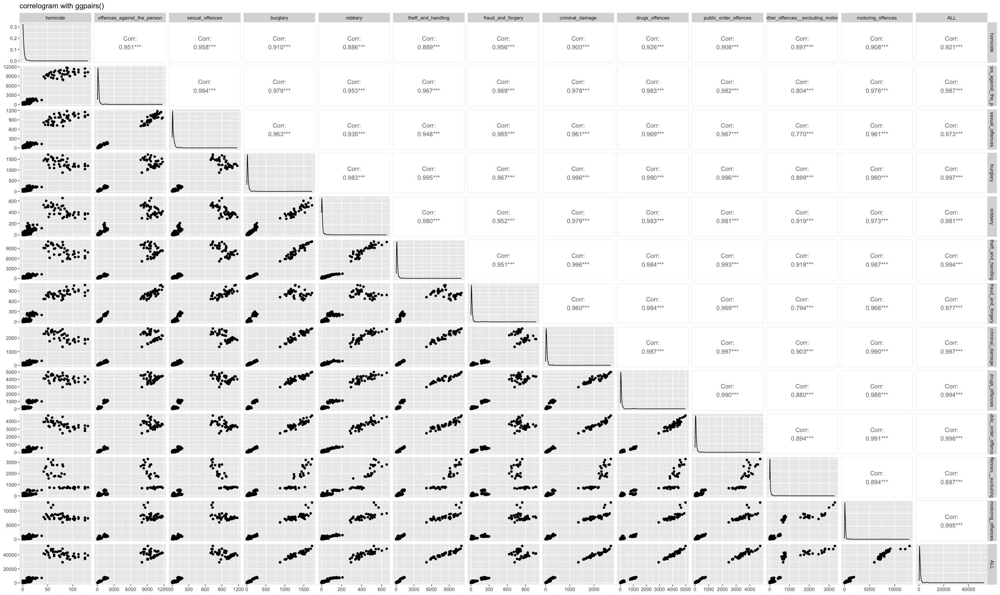

In [127]:
correlation_maker(crime)

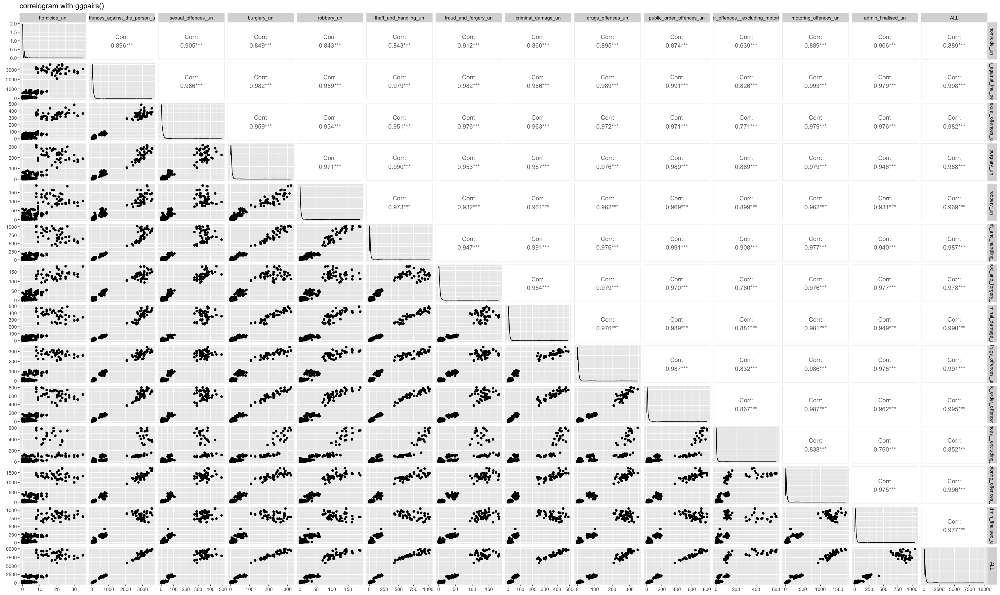

In [128]:
correlation_maker(ucrime)

### Analysis:
The first correlation chart represents the correlation of the successful crime in different categories, while the second one is for the unsuccessful crimes. When we compared the trends of successful and unsuccessful cimes, we comprehended both of them follow the same pattern for almost all kinds of visualizations. Consequently, it is expected that both correlation graphs should share almost same correlations for similar crime categories. Considering these graphs and comparing the correlation numbers, we can see they support our assumption.

According to the stacked line graph visualisation, we can see different categories in both successful and unsuccessful crimes followed same patter. For example when we had a deep in offences against person, we also had a deep in sexual offences. Although they didn't exactly follow the same ups and downs throughout that period, they have close similarity in fluctuations, but with different intensity. Consequently, we can say that by increasing the total number of the crimes, they will be distribute in different categories following its previous distributioin. For instance, if having 100 crime contains 10 robbery, by adding a new hundread, we expect that around 10 of new crimes be robbery also. And our correlation analysis proves our hypothesis. as we can see the features are highly correlated. Also all of them are possitive that means by increasing one feature, the other feature will be increase as wee.

Although the majority of the categories are highly correlated, a few such as offences excluding motoring are less correlated. While the correlations coeficient for feature pairs are mostly over 0.85, the mentioned category contains smaller values such as 0.69.

In [263]:
grouped_by_date

homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
51,9087,736,1715,522,11057,846,2693,4988,4752,3291,12945,52683
61,8366,712,1549,541,10150,758,2455,4565,3787,3208,12078,48230
57,8595,731,1618,569,10716,814,2413,4649,3920,2994,11155,48231
81,7805,698,1470,517,10045,666,2259,4536,3549,2640,8283,42549
69,8178,721,1562,532,10146,754,2403,4510,4022,2753,8615,44265
61,8444,778,1467,512,9938,708,2466,4563,4023,2743,8407,44110
80,9662,900,1679,650,10922,785,2645,4890,4586,2799,9117,48715
45,8342,739,1524,484,9119,672,2310,4097,3950,2465,7141,40888
47,9369,853,1491,602,10041,781,2483,4558,4390,2619,8858,46092


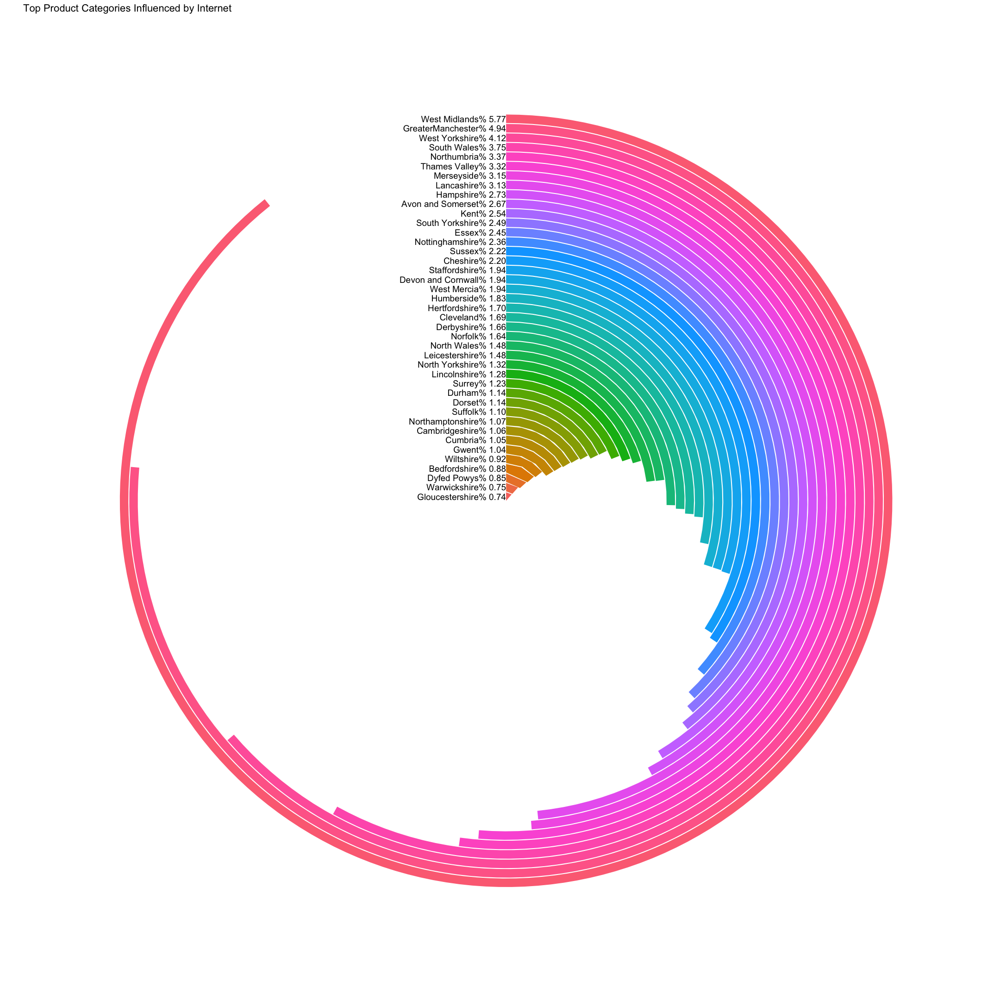

In [563]:

# make sample dataframe

Category <- data[order(-data$value),][-1,]$labeler
Percent <- data[order(-data$value),][-1,]$value

internetImportance<-data.frame(Category,Percent)

# append number to category name
internetImportance$Category <-
     paste0(internetImportance$Category)

# set factor so it will plot in descending order 
internetImportance$Category <-
    factor(internetImportance$Category, 
    levels=rev(internetImportance$Category))


options(repr.plot.width = 18, repr.plot.height = 18)


# plot

ggplot(internetImportance, aes(x = Category, y = Percent,
    fill = Category)) + 
    geom_bar(width = 0.9, stat="identity") + 
    coord_polar(theta = "y") +
    xlab("") + ylab("") +
    ylim(c(0,130000)) +
    ggtitle("Top Product Categories Influenced by Internet") +
    geom_text(data = internetImportance, hjust = 1, size = 4,
              aes(x = Category, y = 0, label = Category)) +
    theme_minimal() +
    theme(legend.position = "none",
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          axis.line = element_blank(),
          axis.text.y = element_blank(),
          axis.text.x = element_blank(),
          axis.ticks = element_blank())


In [1566]:
crime %>% filter(region == "All", month =="jan")

region,area,month,year,date,homicide,offences_against_the_person,sexual_offences,burglary,robbery,theft_and_handling,fraud_and_forgery,criminal_damage,drugs_offences,public_order_offences,all_other_offences__excluding_motoring_,motoring_offences,ALL
<chr>,<chr>,<chr>,<chr>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>
All,National,jan,2014,2014-01-01,51,9087,736,1715,522,11057,846,2693,4988,4752,3291,12945,52683
All,National,jan,2015,2015-01-01,49,9627,859,1405,495,9751,761,2489,4370,4211,1934,8408,44359
All,National,jan,2016,2016-01-01,88,11741,971,1371,419,8276,1027,2166,4457,3597,710,7962,42785
All,National,jan,2017,2017-01-01,83,10719,1060,1192,317,7846,914,1985,3930,3344,749,7913,40052
All,National,jan,2018,2018-01-01,91,10147,959,1098,366,6342,902,1847,3752,3272,813,7932,37521


In [8]:
library(tidyverse)

folder_names <- list.files('/content/drive/MyDrive/R Project/', full.names = TRUE, recursive = TRUE)
folder_names <- folder_names[!sapply(folder_names, function(x) identical(x, "/content/drive/MyDrive/R Project/"))]
file_names <- lapply(folder_names, function(x) list.files(x, full.names = TRUE))
names(file_names) <- folder_names

first <- TRUE
s <- 0

for (i in 1:length(folder_names)) {
  for (file in file_names[[i]]) {
    s <- s + 1
    if (first) {
      df <- read.csv(file)
      sample_data <- df
      df$year <- substring(folder_names[i], nchar(folder_names[i]) - 3, nchar(folder_names[i]))
      df$month <- tolower(substring(file, 28, 30))
      sample_data <- df
      first <- FALSE
    }
    else {
      data <- read.csv(file)
      data$year <- substring(folder_names[i], nchar(folder_names[i]) - 3, nchar(folder_names[i]))
      data$month <- tolower(substring(file, 28, 30))
      df <- bind_rows(df, data)
    }
  }
}

df <- df %>% select(-starts_with('Per'))

# Renaming columns to shorter names
cname_dic <- c('Unnamed: 0' = 'area',
               'Number of Homicide Convictions' = 'murders', 'Number of Homicide Unsuccessful' = 'u_murders',
               'Number of Offences Against The Person Convictions' = 'personal', 'Number of Offences Against The Person Unsuccessful' = 'u_personal',
               'Number of Sexual Offences Convictions' = 'sexual', 'Number of Sexual Offences Unsuccessful' = 'u_sexual',
               'Number of Burglary Convictions' = 'burglary', 'Number of Burglary Unsuccessful' = 'u_burglary',
               'Number of Robbery Convictions' = 'robbery', 'Number of Robbery Unsuccessful' = 'u_robbery',
               'Number of Theft And Handling Convictions' = 'theft', 'Number of Theft And Handling Unsuccessful' = 'u_theft',
               'Number of Fraud And Forgery Convictions' = 'fraud', 'Number of Fraud And Forgery Unsuccessful' = 'u_fraud',
               'Number of Criminal Damage Convictions' = 'damage', 'Number of Criminal Damage Unsuccessful' = 'u_damage',
               'Number of Drugs Offences Convictions' = 'drugs', 'Number of Drugs Offences Unsuccessful' = 'u_drugs',
               'Number of Public Order Offences Convictions' = 'public', 'Number of Public Order Offences Unsuccessful' = 'u_public',
               'Number of All Other Offences (excluding Motoring) Convictions' = 'other', 'Number of All Other Offences (excluding Motoring) Unsuccessful' = 'u_other',
               'Number of Motoring Offences Convictions' = 'motoring', 'Number of Motoring Offences Unsuccessful' = 'u_motoring'
)

df <- df %>% rename_with(.fn = ~cname_dic[.], .cols = -c(year, month))
sample_data <- sample_data %>% rename_with(.fn = ~cname_dic[.], .cols = -c(year, month))

# Checking for string inconsistencies
print(paste0('Unique Months in the dataframe: ', unique(df$month)))


ERROR: Error in file_names[[i]]: subscript out of bounds


# Draft:

### Write a analysis for area charts

### Write a analysis for the line charts

### the stacked area chart is problematic as the colour and the name of the different cities are not matched